In [1]:
!pip install torchbnn


In [2]:
import numpy as np
from sklearn import datasets
import torch
import torch.nn as nn
import torch.optim as optim
import torchbnn as bnn
import matplotlib.pyplot as plt

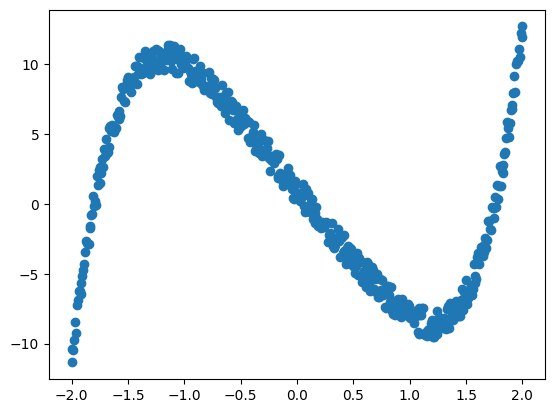

In [3]:
x = torch.linspace(-2, 2, 500)
y = x.pow(5) -10* x.pow(1) + 2*torch.rand(x.size())
x = torch.unsqueeze(x, dim=1)
y = torch.unsqueeze(y, dim=1)

plt.scatter(x.data.numpy(), y.data.numpy())
plt.show()

def clean_target(x):
    return x.pow(5) -10* x.pow(1)+1
def target(x):
    return x.pow(5) -10* x.pow(1) + 2*torch.rand(x.size())

In [25]:
import numpy as np
import torch

def get_all_distribution_params(model, epoch, step_size):
    """
    Extracts the current distribution parameters (mean and sigma) for all Bayesian layers in the model,
    and returns a nested dictionary structured by layer. Each layer dictionary has a
    'posterior' and a 'prior' entry (if applicable), which in turn store the weight
    and bias parameters as dictionaries with keys 'mu' and 'sigma'.

    Args:
        model (nn.Module): The Bayesian model.
        epoch (int): The current epoch number.
        step_size (int): Frequency (in epochs) at which to record the parameters.

    Returns:
        dict: Nested dictionary with keys = layer names.
              Each layer contains:
                  'posterior': {'weight': {'mu': ..., 'sigma': ...}, 'bias': {...}}
                  'prior': {'weight': {'mu': ..., 'sigma': ...}, 'bias': {...}}
              Returns an empty dict if the current epoch is not a logging epoch.
    """
    if epoch % step_size != 0:
        return {}

    # Helper function to ensure values are tensors.
    def to_tensor(x):
        return x if isinstance(x, torch.Tensor) else torch.tensor(x)

    dist_dict = {}
    for name, module in model.named_modules():
        # Check if the module has any Bayesian parameters.
        has_posterior = hasattr(module, 'weight_mu')
        has_bias = hasattr(module, 'bias_mu') and module.bias_mu is not None
        has_prior = hasattr(module, 'prior_mu')
        has_prior_bias = hasattr(module, 'prior_bias_mu') and module.bias_mu is not None

        # Skip modules that don't have any Bayesian parameters.
        if not (has_posterior or has_prior):
            continue

        # Initialize this layer's entry.
        dist_dict[name] = {"posterior": {}, "prior": {}}

        # Posterior parameters (weights)
        if has_posterior:
            mu_weight = module.weight_mu.detach().cpu().numpy().copy()
            sigma_weight = torch.exp(module.weight_log_sigma).detach().cpu().numpy().copy()
            dist_dict[name]["posterior"]["weight"] = {"mu": mu_weight, "sigma": sigma_weight}

        # Posterior parameters (biases)
        if has_bias:
            mu_bias = module.bias_mu.detach().cpu().numpy().copy()
            sigma_bias = torch.exp(module.bias_log_sigma).detach().cpu().numpy().copy()
            dist_dict[name]["posterior"]["bias"] = {"mu": mu_bias, "sigma": sigma_bias}

        # Prior parameters (weights)
        if has_prior:
            # Convert to tensor if necessary.
            prior_mu_weight = to_tensor(module.prior_mu).detach().cpu().numpy().copy()
            prior_sigma_weight = torch.exp(to_tensor(module.prior_log_sigma)).detach().cpu().numpy().copy()
            dist_dict[name]["prior"]["weight"] = {"mu": prior_mu_weight, "sigma": prior_sigma_weight}

        # Prior parameters (biases)
        if has_prior_bias:
            prior_mu_bias = to_tensor(module.prior_bias_mu).detach().cpu().numpy().copy()
            prior_sigma_bias = torch.exp(to_tensor(module.prior_bias_log_sigma)).detach().cpu().numpy().copy()
            dist_dict[name]["prior"]["bias"] = {"mu": prior_mu_bias, "sigma": prior_sigma_bias}

    return dist_dict


In [5]:
import numpy as np
import matplotlib.pyplot as plt
def plot_params_log_distributions(distribution_log, num_points=200, dist_type='posterior'):
    """
    For each individual parameter element (each scalar weight or bias) logged in distribution_log,
    this function plots its distribution (as a Gaussian using μ and σ) over epochs.

    Each element gets its own figure, and all epochs are plotted on the same axes with a color
    gradient from dark red (first epoch) to neon green (final epoch).

    Args:
        distribution_log (dict): Dictionary where each key is an epoch and its value is a nested
                                 dictionary with layer names, each holding "posterior" and "prior" data.
        num_points (int): Number of x-axis points to compute for the Gaussian curve.
        dist_type (str): Either 'posterior' or 'prior' to select which distribution to plot.
    """
    # Organize the data by parameter name and by individual element index.
    # For example, key = "layer1.weight"
    param_data = {}
    for epoch in sorted(distribution_log.keys()):
        epoch_data = distribution_log[epoch]
        for layer_name, layer_data in epoch_data.items():
            if dist_type not in layer_data:
                continue
            for param_type, data in layer_data[dist_type].items():
                full_name = f"{layer_name}.{param_type}"
                mu_arr = data["mu"]
                sigma_arr = data["sigma"]
                mu_flat = mu_arr.flatten()
                sigma_flat = sigma_arr.flatten()
                for idx, (mu_val, sigma_val) in enumerate(zip(mu_flat, sigma_flat)):
                    if full_name not in param_data:
                        param_data[full_name] = {}
                    if idx not in param_data[full_name]:
                        param_data[full_name][idx] = {'epochs': [], 'mu': [], 'sigma': []}
                    param_data[full_name][idx]['epochs'].append(epoch)
                    param_data[full_name][idx]['mu'].append(mu_val)
                    param_data[full_name][idx]['sigma'].append(sigma_val)

    # Define the start (dark red) and end (neon green) colors in RGB.
    start_color = np.array([139/255, 0, 0])   # Dark red
    end_color   = np.array([0, 1, 0])          # Neon green

    # For each parameter and for each element, plot the evolution of its distribution.
    for name, elements in param_data.items():
        for idx, stats in elements.items():
            epochs = stats['epochs']
            mus = stats['mu']
            sigmas = stats['sigma']

            # Determine a common x-range for plotting.
            x_min = min(m - 3*s for m, s in zip(mus, sigmas))
            x_max = max(m + 3*s for m, s in zip(mus, sigmas))
            x_vals = np.linspace(x_min, x_max, num_points)

            plt.figure(figsize=(8, 6))
            n_epochs = len(epochs)
            for i, (epoch_val, mu_val, sigma_val) in enumerate(zip(epochs, mus, sigmas)):
                pdf_vals = (1 / (sigma_val * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x_vals - mu_val) / sigma_val)**2)
                # Interpolate color.
                fraction = i / (n_epochs - 1) if n_epochs > 1 else 0
                color = start_color + (end_color - start_color) * fraction
                plt.plot(x_vals, pdf_vals, color=color, label=f"Epoch {epoch_val}")
            plt.title(f"Distribution evolution for {name} element {idx}")
            plt.xlabel("Value")
            plt.ylabel("Density")
            plt.legend()
            plt.tight_layout()
            plt.show()


# Example usage:
#plot_params_log_distributions(params_log)


In [6]:
def plot_epoch_distributions(distribution_log, num_points=200, alpha=0.6, dist_type='posterior'):
    """
    For each epoch in distribution_log, this function creates one plot that overlays the
    Gaussian distributions (using μ and σ) of all individual weights and biases.

    Args:
        distribution_log (dict): Dictionary with epoch keys and nested layer dictionaries.
        num_points (int): Number of points used to plot the Gaussian curves.
        alpha (float): Transparency level for each curve.
        dist_type (str): Either 'posterior' or 'prior' to select which distribution to plot.
    """
    cmap = plt.get_cmap("viridis")
    for epoch in sorted(distribution_log.keys()):
        epoch_data = distribution_log[epoch]
        distributions = []  # List of tuples: (full_param_name, idx, mu, sigma)
        x_bounds = []
        for layer_name, layer_data in epoch_data.items():
            if dist_type not in layer_data:
                continue
            for param_type, data in layer_data[dist_type].items():
                full_name = f"{layer_name}.{param_type}"
                mu_arr = data["mu"]
                sigma_arr = data["sigma"]
                mu_flat = mu_arr.flatten()
                sigma_flat = sigma_arr.flatten()
                for idx, (mu_val, sigma_val) in enumerate(zip(mu_flat, sigma_flat)):
                    distributions.append((full_name, idx, mu_val, sigma_val))
                    x_bounds.append(mu_val - 3 * sigma_val)
                    x_bounds.append(mu_val + 3 * sigma_val)
        if not x_bounds:
            continue
        x_min = min(x_bounds)
        x_max = max(x_bounds)
        x_vals = np.linspace(x_min, x_max, num_points)
        plt.figure(figsize=(10, 6))
        num_distributions = len(distributions)
        for i, (full_name, idx, mu_val, sigma_val) in enumerate(distributions):
            color = cmap(i / num_distributions)
            pdf_vals = (1 / (sigma_val * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x_vals - mu_val) / sigma_val)**2)
            plt.plot(x_vals, pdf_vals, color=color, alpha=alpha)
        plt.title(f"Overlay of all {dist_type} distributions at epoch {epoch}")
        plt.xlabel("Value")
        plt.ylabel("Density")
        plt.tight_layout()
        plt.show()

# Example usage:
#plot_epoch_distributions(params_log)


In [7]:
def plot_mu_sigma_histograms(distribution_log, epoch=None, dist_type='posterior', bins=50):
    """
    Create two side-by-side histograms: one for all μ values and one for all σ values
    from the distribution log at a specified epoch. If no epoch is provided, the last
    logged epoch is used. The user can also choose to plot 'posterior' or 'prior' data.

    Args:
        distribution_log (dict): Nested dictionary of logged distributions keyed by epoch.
        epoch (int, optional): Epoch to plot. Defaults to the last logged epoch.
        dist_type (str): Either 'posterior' or 'prior'. Defaults to 'prior'.
        bins (int): Number of bins for the histograms. Defaults to 50.
    """
    if not distribution_log:
        print("Distribution log is empty!")
        return

    # Use the last epoch if none is provided.
    if epoch is None:
        epoch = max(distribution_log.keys())

    if epoch not in distribution_log:
        print(f"Epoch {epoch} not found in the distribution log.")
        return

    epoch_data = distribution_log[epoch]

    mu_values = []
    sigma_values = []

    # Loop over layers and accumulate all μ and σ values for the specified distribution type.
    for layer_name, layer_data in epoch_data.items():
        if dist_type not in layer_data:
            continue
        for param_type, param_data in layer_data[dist_type].items():
            mu_arr = param_data.get("mu")
            sigma_arr = param_data.get("sigma")
            if mu_arr is not None:
                mu_values.extend(mu_arr.flatten().tolist())
            if sigma_arr is not None:
                sigma_values.extend(sigma_arr.flatten().tolist())

    # Create two side-by-side histograms.
    fig, axs = plt.subplots(1, 2, figsize=(14, 6))

    axs[0].hist(mu_values, bins=bins, color='skyblue', edgecolor='black')
    axs[0].set_title(f"Histogram of μ ({dist_type}) at epoch {epoch}")
    axs[0].set_xlabel("μ values")
    axs[0].set_ylabel("Count")

    axs[1].hist(sigma_values, bins=bins, color='salmon', edgecolor='black')
    axs[1].set_title(f"Histogram of σ ({dist_type}) at epoch {epoch}")
    axs[1].set_xlabel("σ values")
    axs[1].set_ylabel("Count")

    plt.tight_layout()
    plt.show()


In [8]:
import numpy as np
import pandas as pd

import numpy as np
import pandas as pd

def get_overall_weight_stats(distribution_log, epoch=None, dist_type='posterior'):
    """
    Computes aggregated statistics for all weight distributions (ignoring biases) at a given epoch,
    and returns a table (DataFrame) that includes:

      - Overall: the mean and standard deviation of all μ's and σ's across layers.
      - Per-layer: the mean and standard deviation of μ's and σ's for each layer.

    Args:
        distribution_log (dict): Nested dictionary of logged distributions keyed by epoch.
        epoch (int, optional): The epoch to analyze. Defaults to the last logged epoch.
        dist_type (str): Either 'posterior' or 'prior'. Defaults to 'posterior'.

    Returns:
        pd.DataFrame: A table with columns "Layer", "Mean of Mu's", "SD of Mu's",
                      "Mean of Sigma's", and "SD of Sigma's".
                      The first row shows overall stats, followed by one row per layer.
    """
    if not distribution_log:
        print("Distribution log is empty!")
        return pd.DataFrame()

    # Use the last logged epoch if none provided.
    if epoch is None:
        epoch = max(distribution_log.keys())

    if epoch not in distribution_log:
        print(f"Epoch {epoch} not found in the distribution log.")
        return pd.DataFrame()

    epoch_data = distribution_log[epoch]
    overall_mu = []
    overall_sigma = []
    rows = []

    # Loop over each layer in the epoch.
    for layer_name, layer_data in epoch_data.items():
        # Skip layers that do not have the chosen distribution type or weight data.
        if dist_type not in layer_data or 'weight' not in layer_data[dist_type]:
            continue

        weight_data = layer_data[dist_type]['weight']
        mu_arr = weight_data.get("mu")
        sigma_arr = weight_data.get("sigma")

        if mu_arr is None or sigma_arr is None:
            continue

        # Flatten the arrays.
        mu_vals = mu_arr.flatten().tolist()
        sigma_vals = sigma_arr.flatten().tolist()

        # Append to overall stats.
        overall_mu.extend(mu_vals)
        overall_sigma.extend(sigma_vals)

        # Compute per-layer stats.
        layer_mean_mu = np.mean(mu_vals)
        layer_std_mu = np.std(mu_vals)
        layer_mean_sigma = np.mean(sigma_vals)
        layer_std_sigma = np.std(sigma_vals)

        rows.append({
            "Layer": layer_name,
            "Mean of Mu's": layer_mean_mu,
            "SD of Mu's": layer_std_mu,
            "Mean of Sigma's": layer_mean_sigma,
            "SD of Sigma's": layer_std_sigma
        })

    if not overall_mu or not overall_sigma:
        print("No weight distributions found for the specified options!")
        return pd.DataFrame()

    # Compute overall stats.
    overall_stats = {
        "Layer": "Overall",
        "Mean of Mu's": np.mean(overall_mu),
        "SD of Mu's": np.std(overall_mu),
        "Mean of Sigma's": np.mean(overall_sigma),
        "SD of Sigma's": np.std(overall_sigma)
    }

    # Insert overall stats as the first row.
    rows.insert(0, overall_stats)

    stats_df = pd.DataFrame(rows)
    return stats_df

# Example usage:
# overall_stats_df = get_overall_weight_stats(distribution_log)
# print(overall_stats_df)
# per_layer_stats_df = get_overall_weight_stats(distribution_log, epoch=50, dist_type='prior')
# print(per_layer_stats_df)


In [43]:
import math
import torch
import torch.nn as nn
from torch.nn import Parameter
import torch.nn.functional as F

class HierarchicalBayesLinear(nn.Module):
    def __init__(self, in_features, out_features, bias=True):
        super(HierarchicalBayesLinear, self).__init__()
        self.in_features = in_features
        self.out_features = out_features

        # Posterior parameters for weights: these are learned to fit the data.
        self.weight_mu = Parameter(torch.Tensor(out_features, in_features))
        self.weight_log_sigma = Parameter(torch.Tensor(out_features, in_features))

        self.prior_mu = Parameter(torch.zeros(1, 1))
        self.prior_log_sigma = Parameter(torch.full((1, 1), -3.0))

        if bias:
            self.bias_mu = Parameter(torch.Tensor(out_features))
            self.bias_log_sigma = Parameter(torch.Tensor(out_features))
            # Learnable prior for bias.
            self.prior_bias_mu = Parameter(torch.zeros(1))
            self.prior_bias_log_sigma = Parameter(torch.full((1,), -3.0))
        else:
            self.register_parameter('bias_mu', None)
            self.register_parameter('bias_log_sigma', None)
            self.register_parameter('prior_bias_mu', None)
            self.register_parameter('prior_bias_log_sigma', None)

        self.reset_parameters()

    def reset_parameters(self):
        stdv = 1. / math.sqrt(self.in_features)
        # Initialize posterior parameters for weights.
        self.weight_mu.data.uniform_(-stdv, stdv)
        self.weight_log_sigma.data.fill_(-5.0)
        if self.bias_mu is not None:
            self.bias_mu.data.uniform_(-stdv, stdv)
            self.bias_log_sigma.data.fill_(-5.0)

    def forward(self, input):
        # Sample weights from the posterior distribution using the reparameterization trick.
        weight_eps = torch.randn_like(self.weight_log_sigma)
        weight = self.weight_mu + torch.exp(self.weight_log_sigma) * weight_eps

        if self.bias_mu is not None:
            bias_eps = torch.randn_like(self.bias_log_sigma)
            bias = self.bias_mu + torch.exp(self.bias_log_sigma) * bias_eps
        else:
            bias = None

        return F.linear(input, weight, bias)

    def kl_divergence(self):
        # Compute KL divergence for weights.
        kl_weight = self._kl_divergence(self.weight_mu, self.weight_log_sigma,
                                        self.prior_mu, self.prior_log_sigma)
        # And if present, for biases.
        if self.bias_mu is not None:
            kl_bias = self._kl_divergence(self.bias_mu, self.bias_log_sigma,
                                          self.prior_bias_mu, self.prior_bias_log_sigma)
            return kl_weight + kl_bias
        return kl_weight

    def _kl_divergence(self, mu_q, log_sigma_q, mu_p, log_sigma_p):
        """
        Computes the element-wise KL divergence between two Gaussians:
        q ~ N(mu_q, sigma_q) and p ~ N(mu_p, sigma_p)
        where sigma = exp(log_sigma).
        The formula is:
            KL(q||p) = log(sigma_p/sigma_q) + (sigma_q^2 + (mu_q - mu_p)^2)/(2*sigma_p^2) - 0.5
        """
        sigma_q = torch.exp(log_sigma_q)
        sigma_p = torch.exp(log_sigma_p)
        kl = (log_sigma_p - log_sigma_q +
              (sigma_q**2 + (mu_q - mu_p)**2) / (2 * sigma_p**2) - 0.5)
        return kl.sum()


class HierarchicalBayesNet(nn.Module):
    def __init__(self):
        super(HierarchicalBayesNet, self).__init__()
        self.fc1 = HierarchicalBayesLinear(in_features=1, out_features=10)
        self.fc2 = HierarchicalBayesLinear(in_features=10, out_features=1)
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.activation(self.fc1(x))
        x = self.fc2(x)
        return x

    def kl_divergence(self):
        return self.fc1.kl_divergence() + self.fc2.kl_divergence()

Epoch 0: MSE = 45.7273, KL = 1126.5275
Epoch 10: MSE = 34.9564, KL = 138.7520
Epoch 20: MSE = 32.4461, KL = 64.8895
Epoch 30: MSE = 30.2303, KL = 43.1014
Epoch 40: MSE = 29.0046, KL = 35.2639
Epoch 50: MSE = 28.1969, KL = 34.1630
Epoch 60: MSE = 27.6419, KL = 53.9908
Epoch 70: MSE = 24.0808, KL = 92.4724
Epoch 80: MSE = 21.2065, KL = 117.9973
Epoch 90: MSE = 19.2027, KL = 107.7202


In [48]:
import numpy as np
import pandas as pd

def kl_divergence_univariate(mu0, sigma0, mu1, sigma1):
    """
    Computes the KL divergence from N(mu0, sigma0^2) to N(mu1, sigma1^2)
    for univariate Gaussians.
    """
    return np.log(sigma1 / sigma0) + (sigma0**2 + (mu0 - mu1)**2) / (2 * sigma1**2) - 0.5

def symmetric_kl(mu0, sigma0, mu1, sigma1):
    """
    Computes the symmetric KL divergence between two univariate Gaussian distributions.
    This is given by KL(N0||N1) + KL(N1||N0).
    """
    kl1 = kl_divergence_univariate(mu0, sigma0, mu1, sigma1)
    kl2 = kl_divergence_univariate(mu1, sigma1, mu0, sigma0)
    return kl1 + kl2

def compute_layer_kl_divergences(distribution_log, epoch=None, dist_type='posterior'):
    """
    For a given epoch (defaulting to the last logged epoch) and distribution type
    (default 'posterior'), compute the sum and average of symmetric KL divergences
    between every pair of weight distributions and between every pair of bias distributions
    for each layer. Returns a Pandas DataFrame with one row per layer.

    Columns in the DataFrame are:
       - "Layer"
       - "Weight KL Sum": Sum of symmetric KL divergences over all weight pairs.
       - "Weight KL Average": Average symmetric KL divergence over all weight pairs.
       - "Bias KL Sum": Sum over all bias pairs.
       - "Bias KL Average": Average over all bias pairs.
    """
    if not distribution_log:
        print("Distribution log is empty!")
        return pd.DataFrame()

    # Use the last epoch if none is provided.
    if epoch is None:
        epoch = max(distribution_log.keys())

    if epoch not in distribution_log:
        print(f"Epoch {epoch} not found in the distribution log.")
        return pd.DataFrame()

    epoch_data = distribution_log[epoch]
    results = []

    for layer_name, layer_data in epoch_data.items():
        if dist_type not in layer_data:
            continue

        layer_entry = {"Layer": layer_name,
                       "Weight KL Sum": np.nan, "Weight KL Average": np.nan,
                       "Bias KL Sum": np.nan, "Bias KL Average": np.nan}

        # Process weight distributions.
        weight_sum = 0.0
        weight_count = 0
        if 'weight' in layer_data[dist_type]:
            weight_data = layer_data[dist_type]['weight']
            mu_arr = weight_data.get("mu")
            sigma_arr = weight_data.get("sigma")
            if mu_arr is not None and sigma_arr is not None:
                mu_list = mu_arr.flatten().tolist()
                sigma_list = sigma_arr.flatten().tolist()
                n = len(mu_list)
                for i in range(n):
                    for j in range(i+1, n):
                        weight_sum += symmetric_kl(mu_list[i], sigma_list[i],
                                                   mu_list[j], sigma_list[j])
                        weight_count += 1
        weight_avg = weight_sum / weight_count if weight_count > 0 else 0.0

        # Process bias distributions.
        bias_sum = 0.0
        bias_count = 0
        if 'bias' in layer_data[dist_type]:
            bias_data = layer_data[dist_type]['bias']
            mu_arr = bias_data.get("mu")
            sigma_arr = bias_data.get("sigma")
            if mu_arr is not None and sigma_arr is not None:
                mu_list = mu_arr.flatten().tolist()
                sigma_list = sigma_arr.flatten().tolist()
                n = len(mu_list)
                for i in range(n):
                    for j in range(i+1, n):
                        bias_sum += symmetric_kl(mu_list[i], sigma_list[i],
                                                 mu_list[j], sigma_list[j])
                        bias_count += 1
        bias_avg = bias_sum / bias_count if bias_count > 0 else 0.0

        layer_entry["Weight KL Sum"] = weight_sum
        layer_entry["Weight KL Average"] = weight_avg
        layer_entry["Bias KL Sum"] = bias_sum
        layer_entry["Bias KL Average"] = bias_avg

        results.append(layer_entry)

    df = pd.DataFrame(results)
    return df

# Example usage:
# kl_table = compute_layer_kl_divergences(distribution_log_bnn, epoch=95, dist_type='posterior')
# print(kl_table)


In [44]:
import torch.optim as optim
import matplotlib.pyplot as plt
#Training Loop

model = HierarchicalBayesNet()
mse_loss = nn.MSELoss()
kl_weight = 0.01  # Weight for the KL divergence term.
optimizer = optim.Adam(model.parameters(), lr=0.1)

distribution_log = {}

for epoch in range(100):
    optimizer.zero_grad()
    output = model(x)
    mse = mse_loss(output, y)
    kl = model.kl_divergence()
    loss = mse + kl_weight * kl
    loss.backward()
    optimizer.step()

    # Only log on the specified step.
    log_data = get_all_distribution_params(model, epoch, step_size=5)
    if log_data:  # Only add non-empty logs.
        distribution_log[epoch] = log_data

    if epoch % 10 == 0:
        print(f"Epoch {epoch}: MSE = {mse.item():.4f}, KL = {kl.item():.4f}")

Epoch 0: MSE = 44.7486, KL = 1494.3552
Epoch 10: MSE = 33.0280, KL = 171.3191
Epoch 20: MSE = 28.9856, KL = 121.6567
Epoch 30: MSE = 28.1588, KL = 82.9529
Epoch 40: MSE = 27.7476, KL = 64.6291
Epoch 50: MSE = 27.2101, KL = 64.0251
Epoch 60: MSE = 26.3976, KL = 66.5510
Epoch 70: MSE = 26.2834, KL = 68.8115
Epoch 80: MSE = 27.4761, KL = 73.7107
Epoch 90: MSE = 25.7466, KL = 79.0092


Text(0, 0.5, 'y')

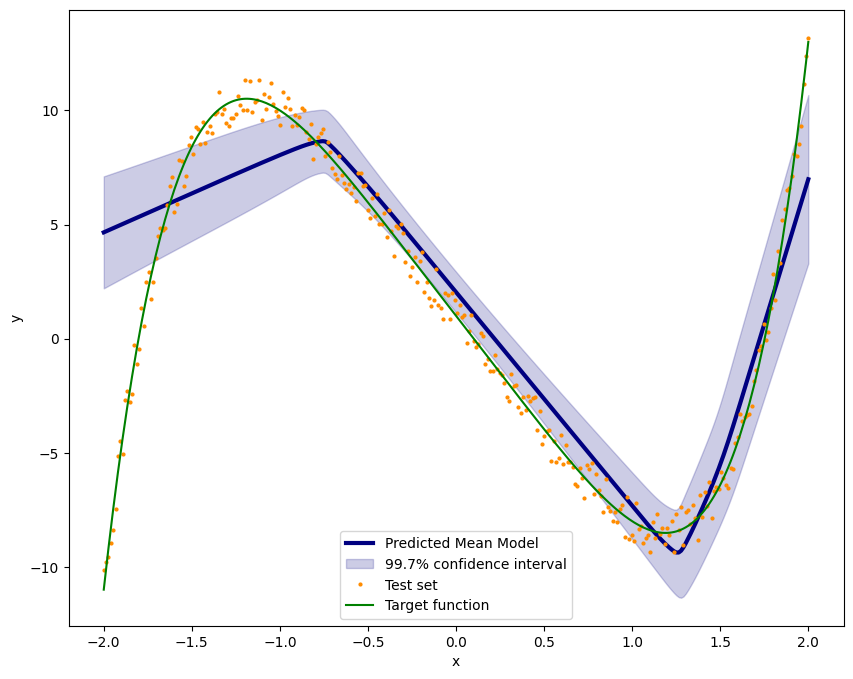

In [11]:
x_test = torch.linspace(-2, 2, 300)
y_test = target(x_test)

x_test = torch.unsqueeze(x_test, dim=1)
y_test = torch.unsqueeze(y_test, dim=1)

models_result = np.array([model(x_test).data.numpy() for k in range(10000)])
models_result = models_result[:,:,0]
models_result = models_result.T
mean_values = np.array([models_result[i].mean() for i in range(len(models_result))])
std_values = np.array([models_result[i].std() for i in range(len(models_result))])

plt.figure(figsize=(10,8))
plt.plot(x_test.data.numpy(),mean_values,color='navy',lw=3,label='Predicted Mean Model')
plt.fill_between(x_test.data.numpy().T[0],mean_values-3.0*std_values,mean_values+3.0*std_values,alpha=0.2,color='navy',label='99.7% confidence interval')
#plt.plot(x_test.data.numpy(),mean_values,color='darkorange')
plt.plot(x_test.data.numpy(),y_test.data.numpy(),'.',color='darkorange',markersize=4,label='Test set')
plt.plot(x_test.data.numpy(),clean_target(x_test).data.numpy(),color='green',markersize=4,label='Target function')
plt.legend()
plt.xlabel('x')
plt.ylabel('y')

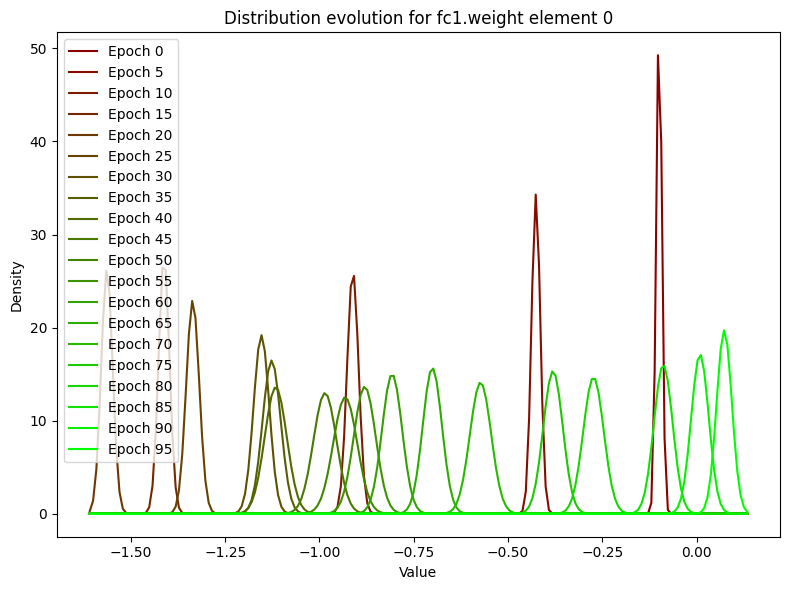

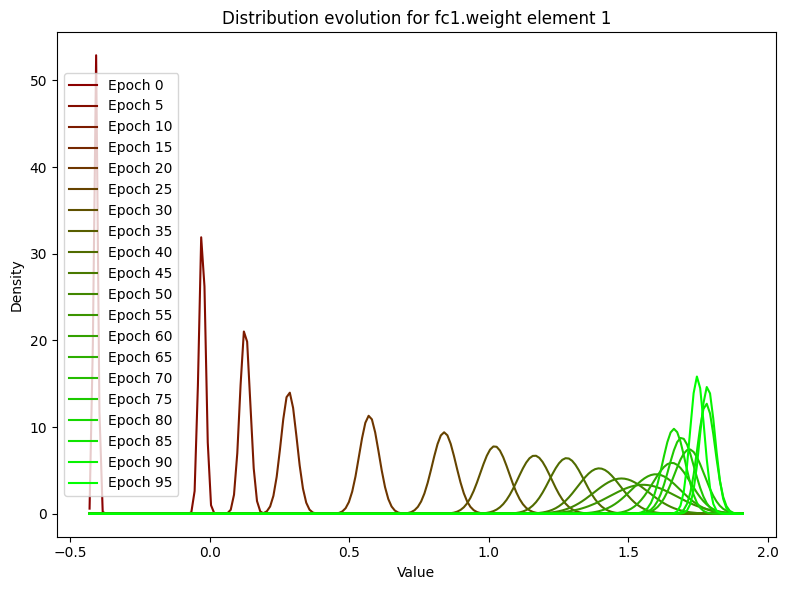

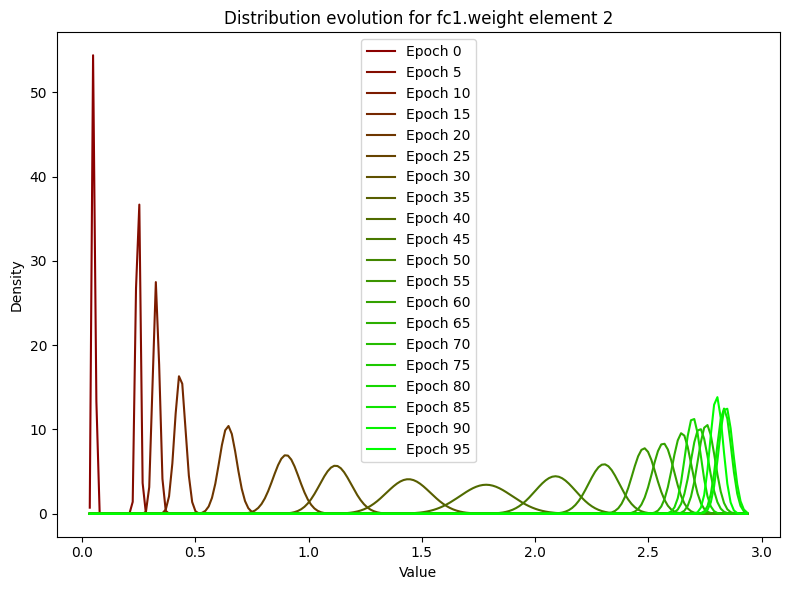

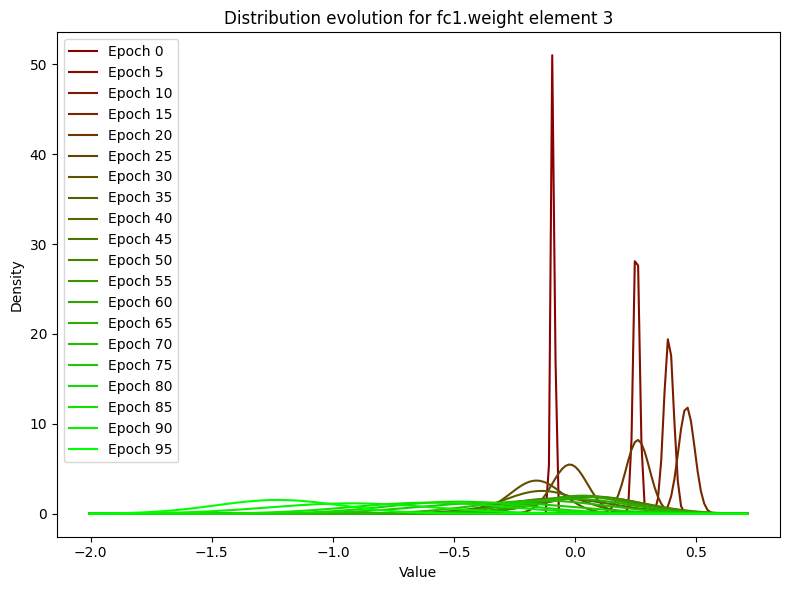

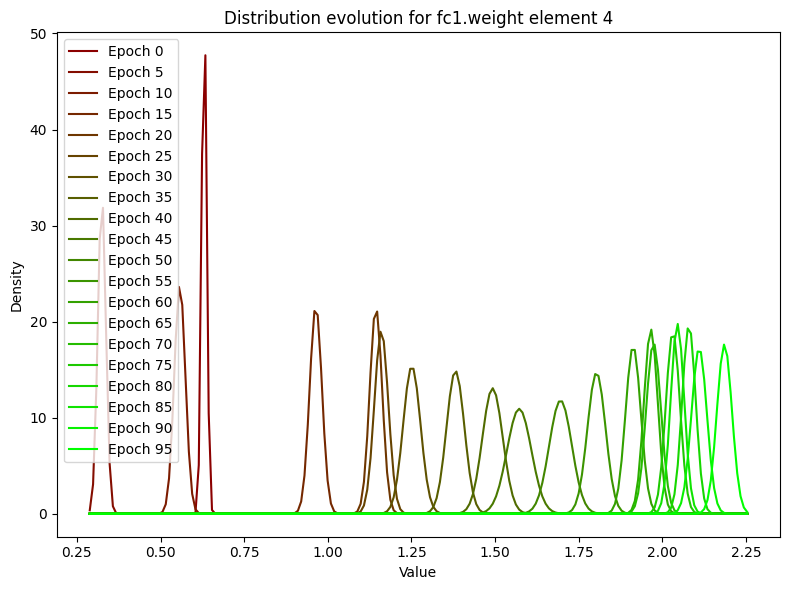

...

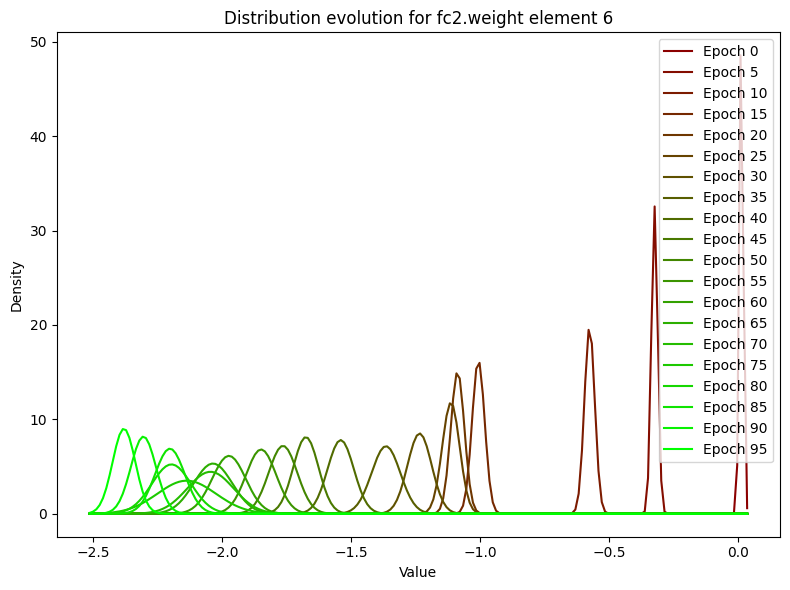

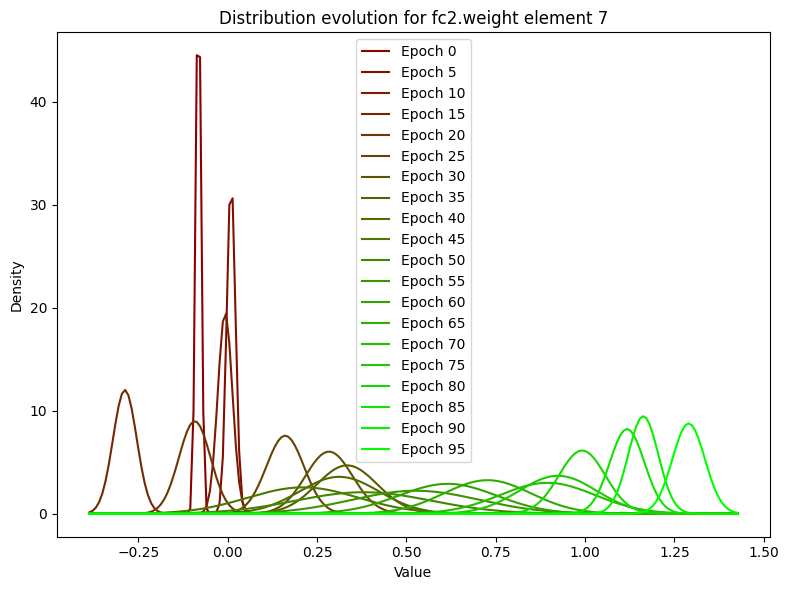

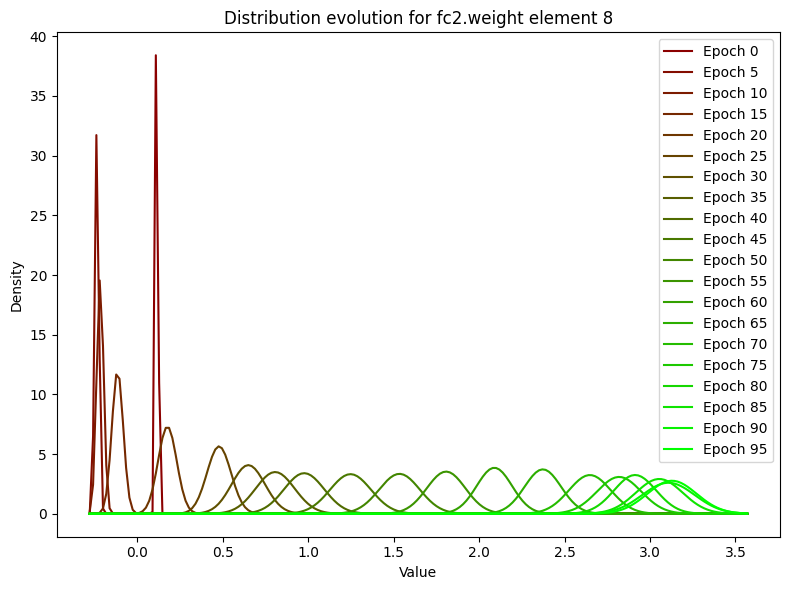

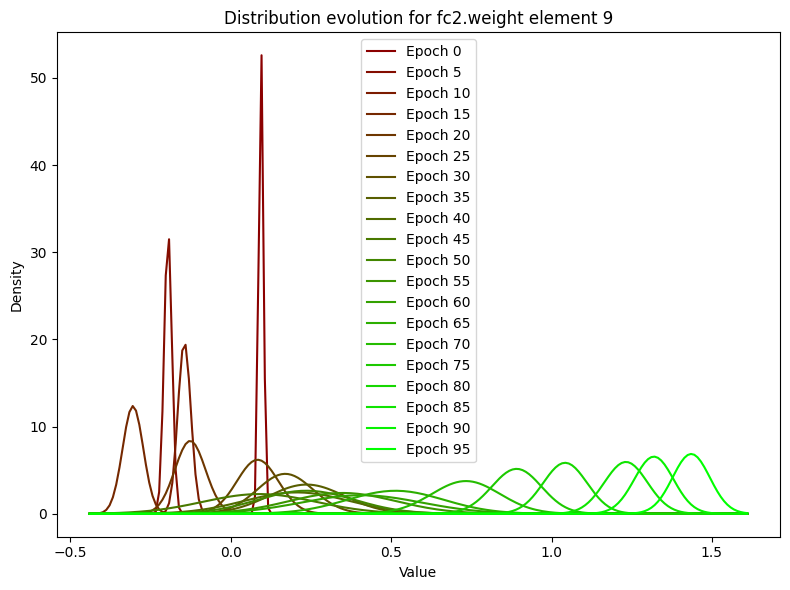

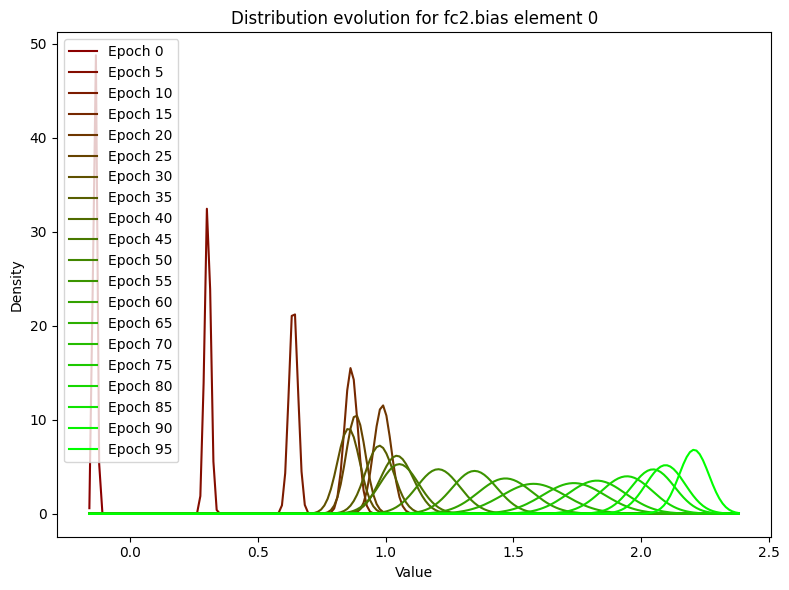

In [12]:
plot_params_log_distributions(distribution_log)

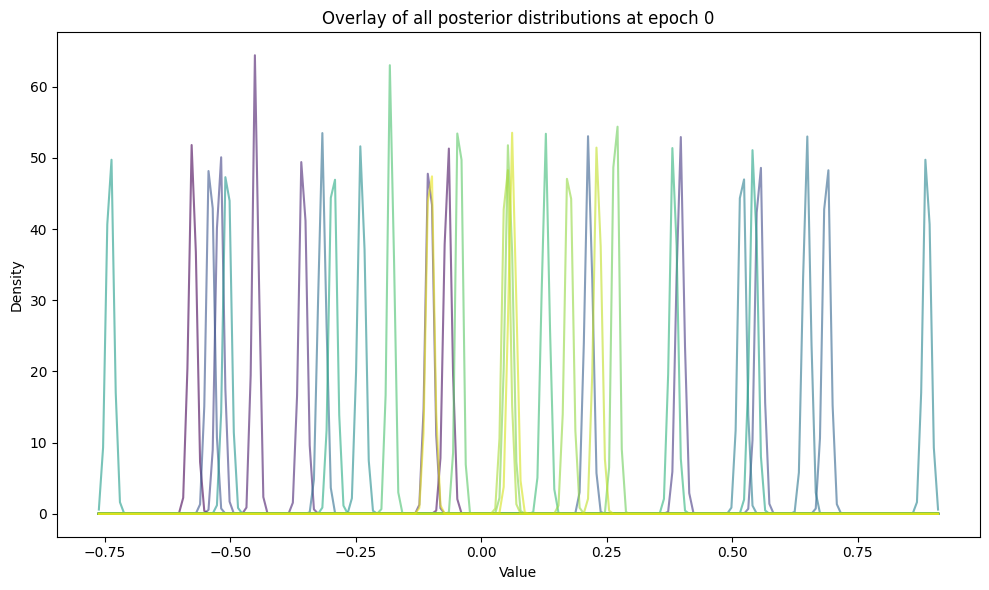

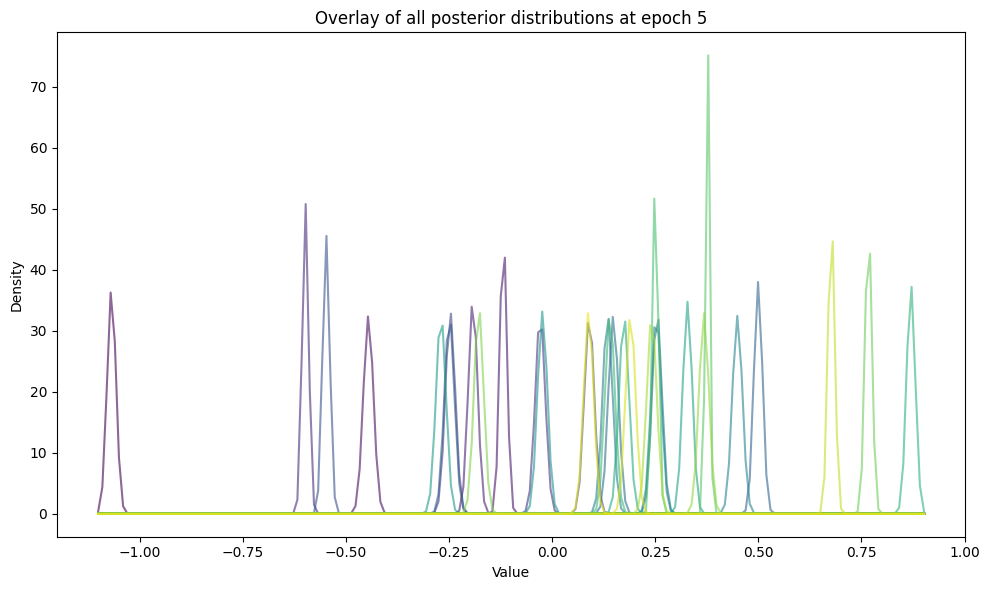

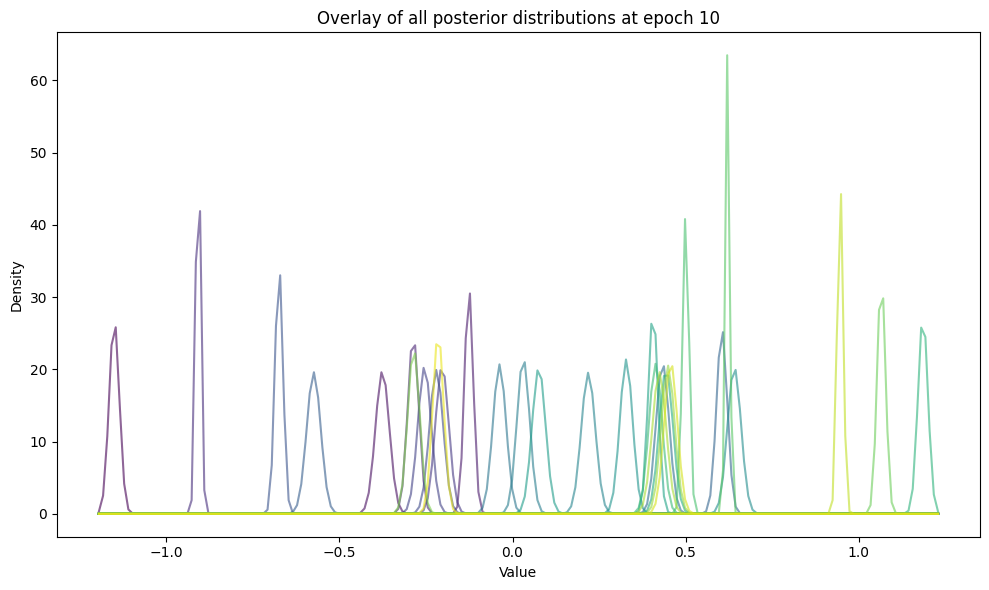

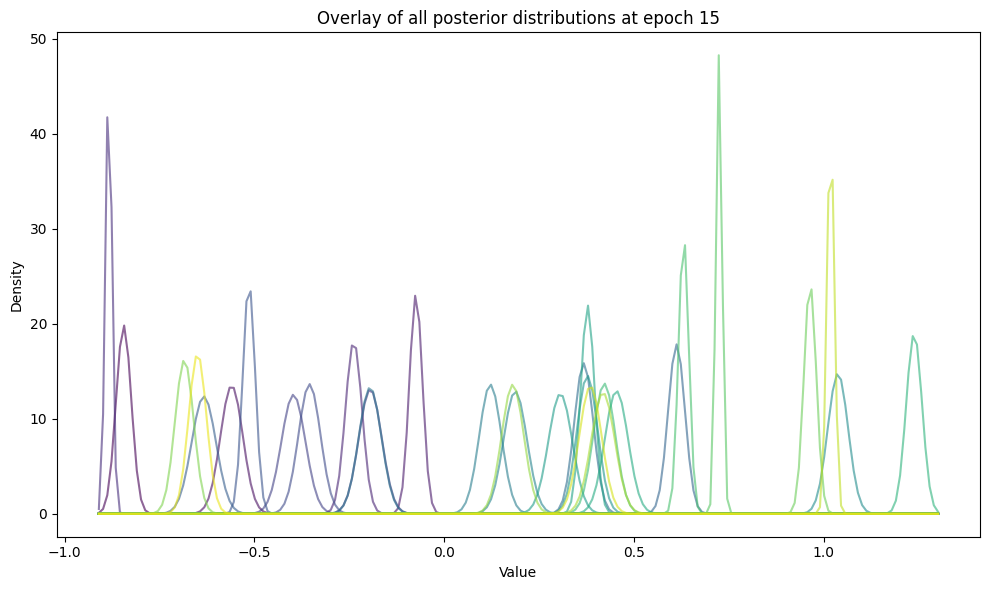

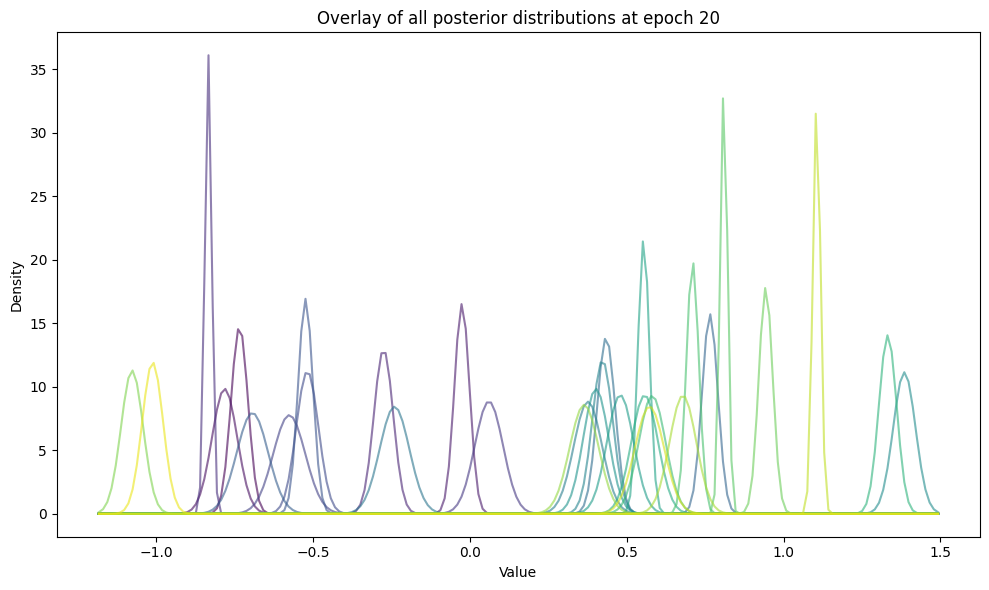

...

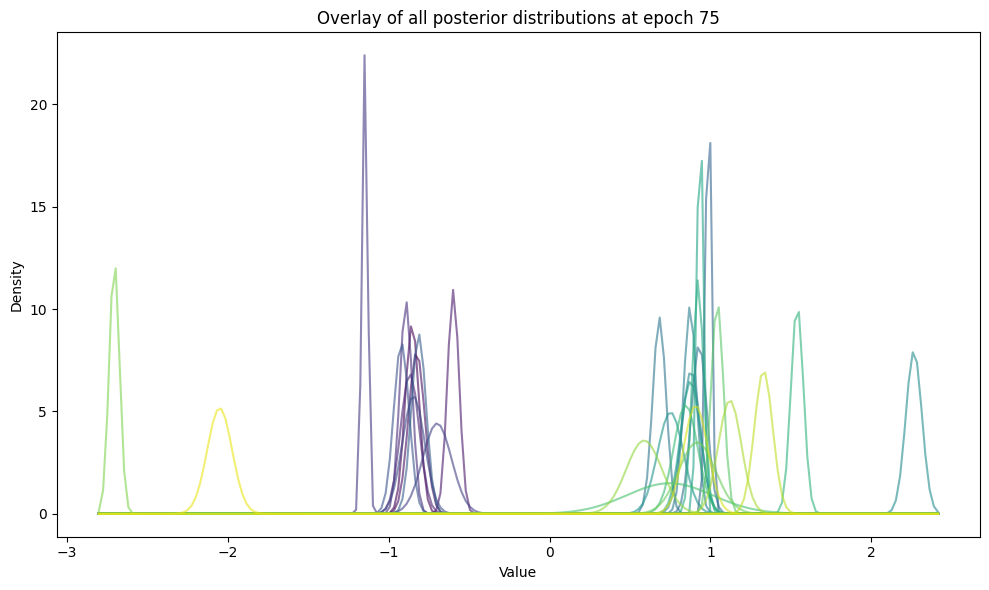

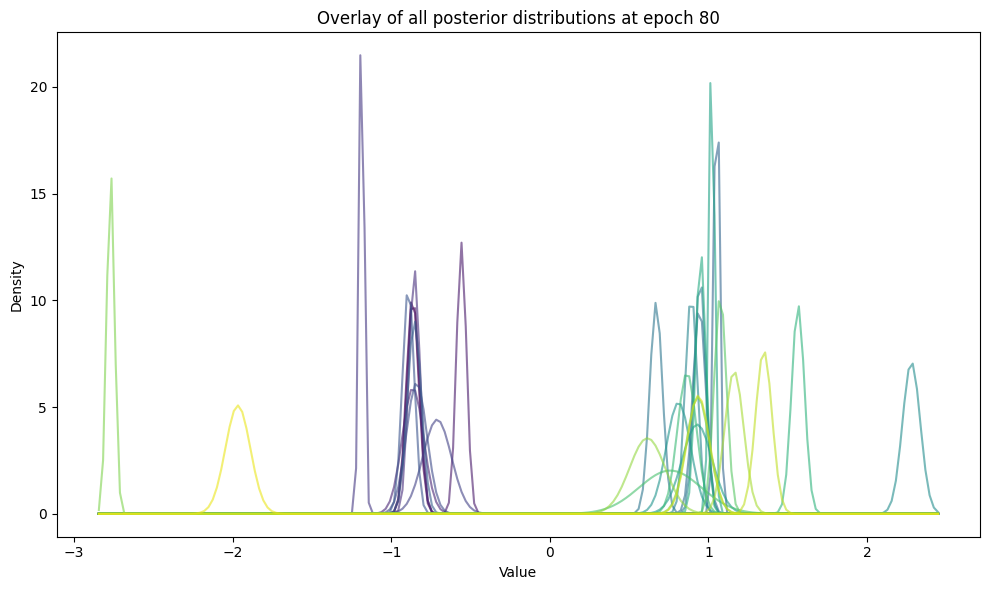

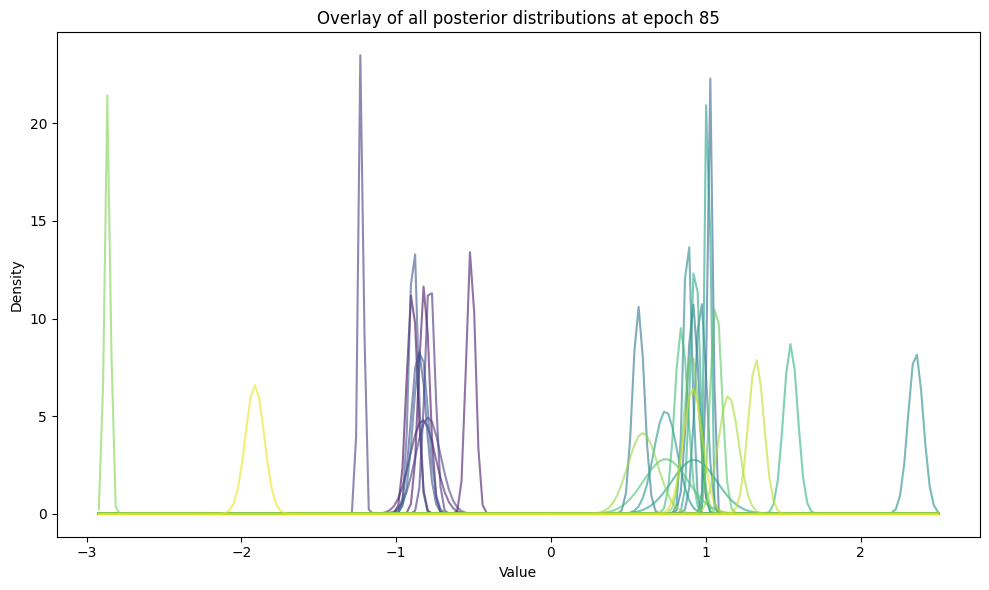

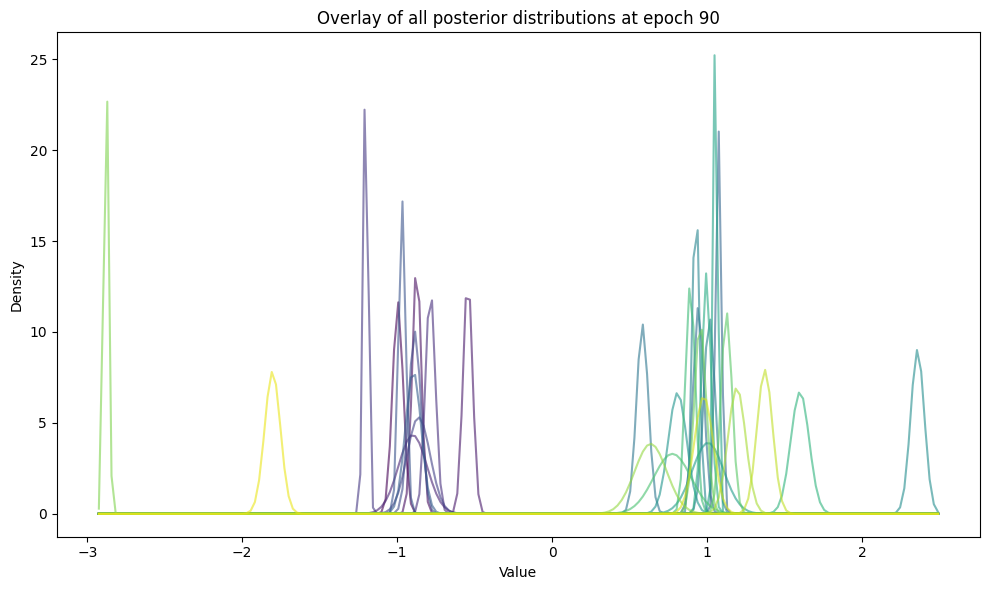

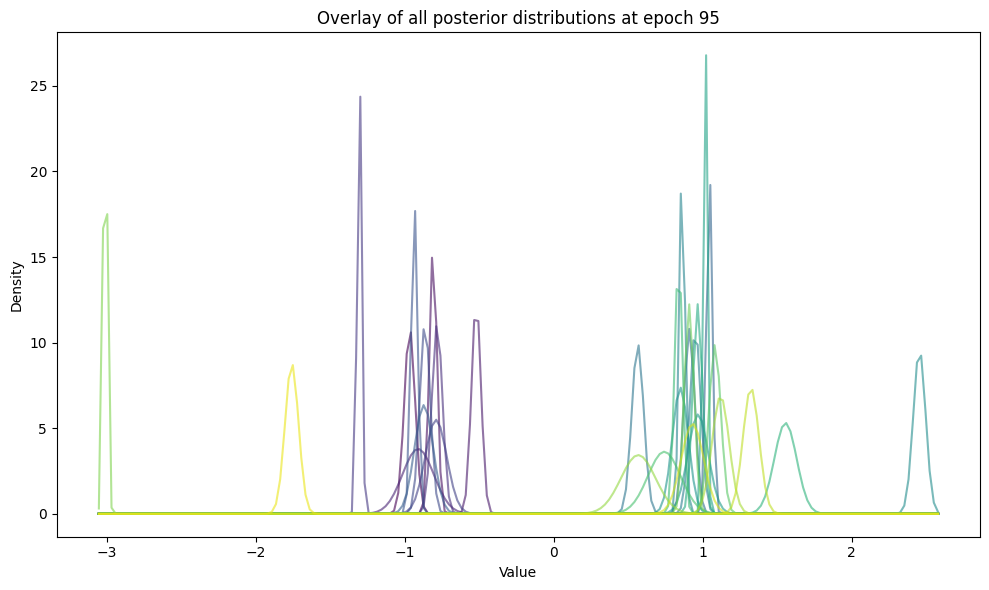

In [45]:
plot_epoch_distributions(distribution_log)

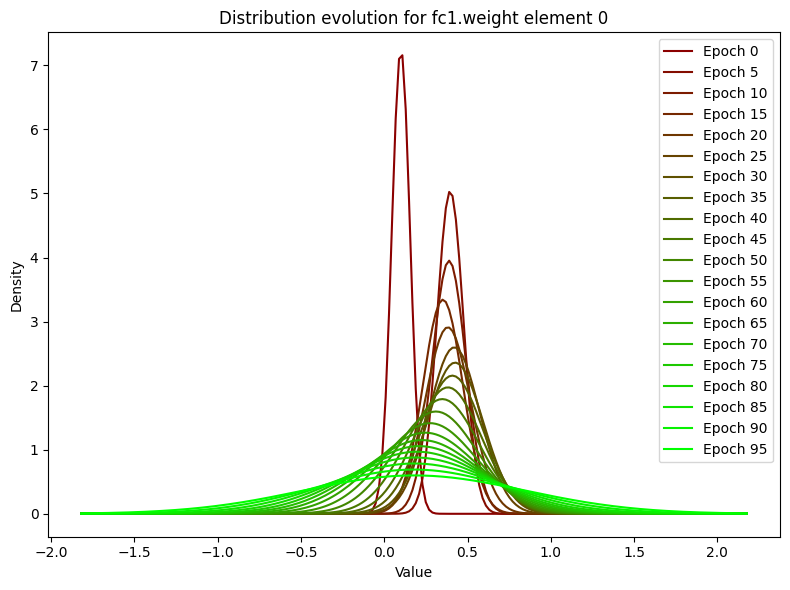

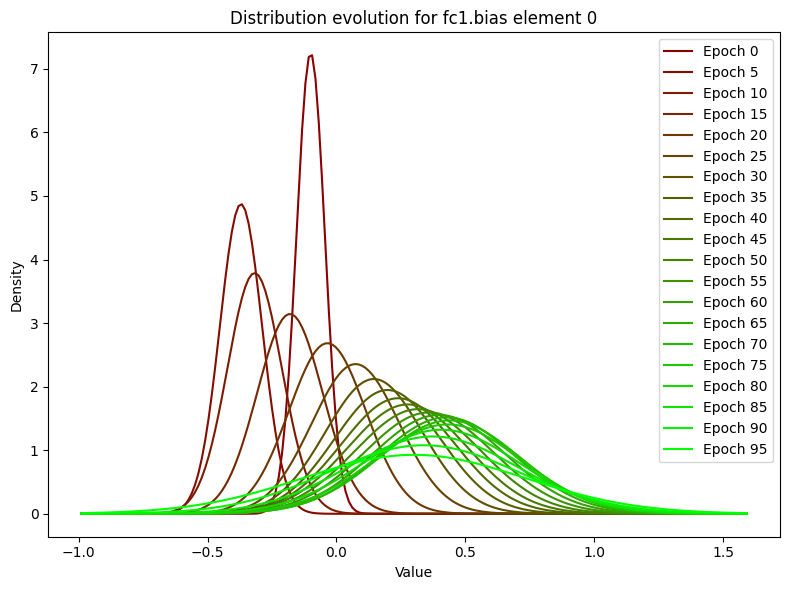

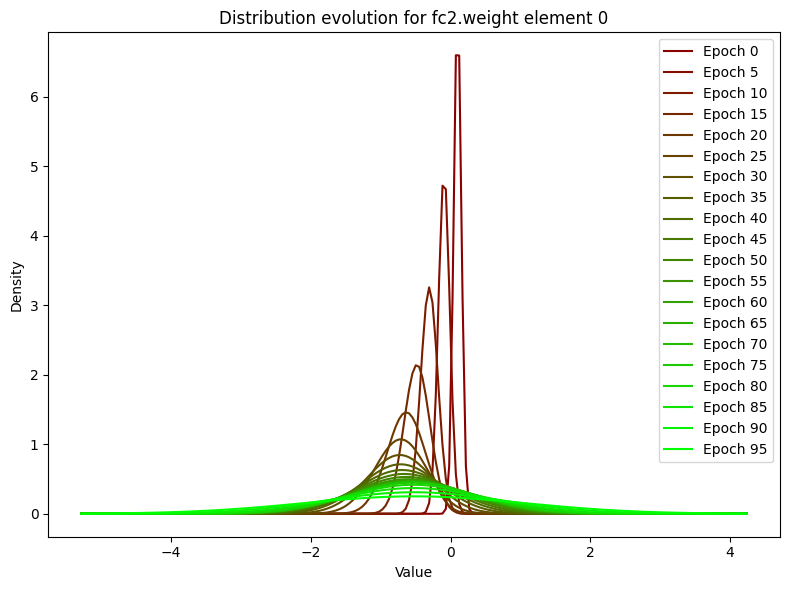

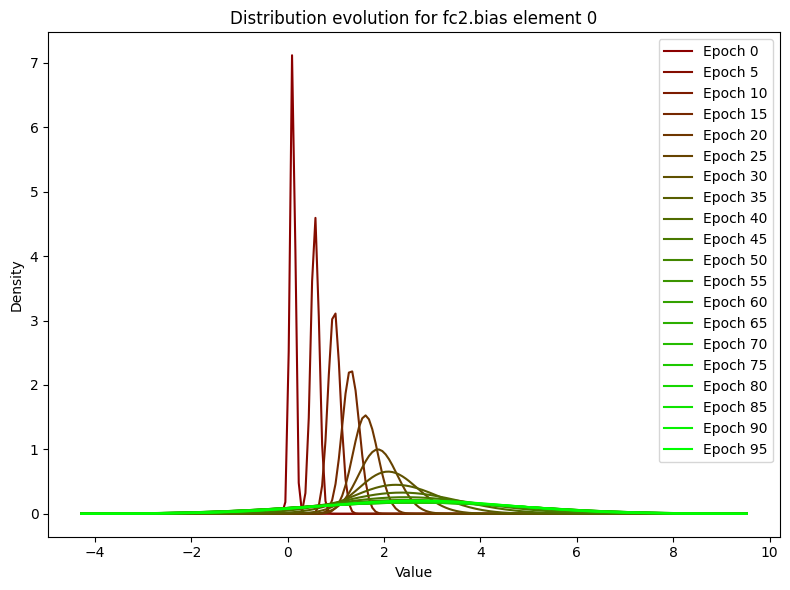

In [18]:
plot_params_log_distributions(distribution_log, dist_type= 'prior')

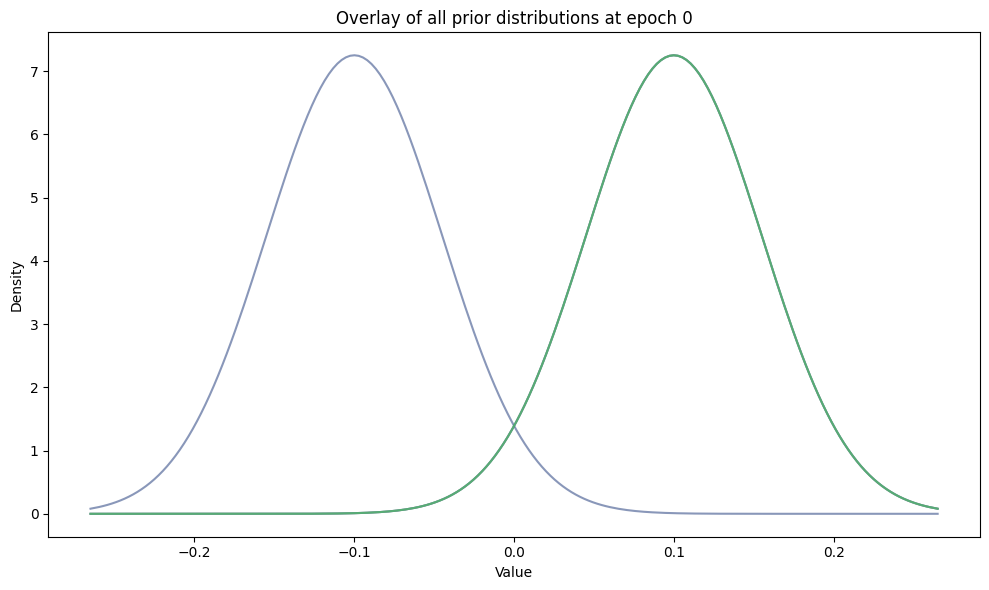

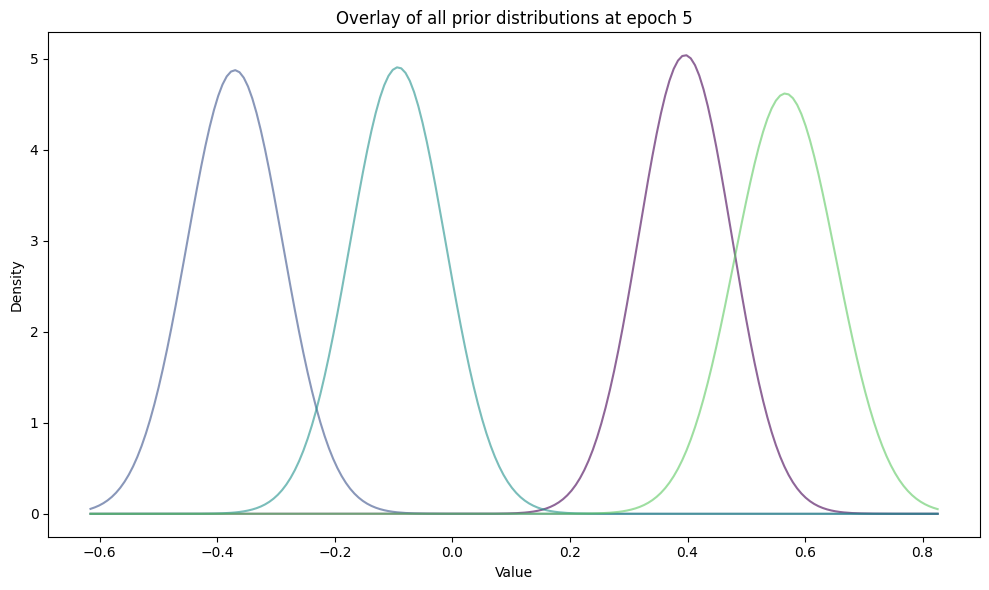

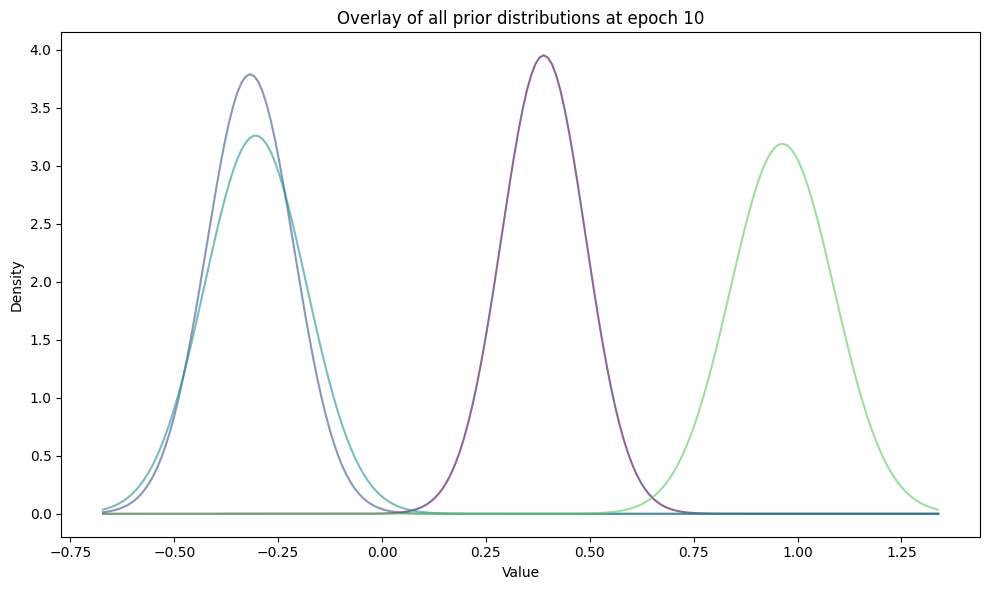

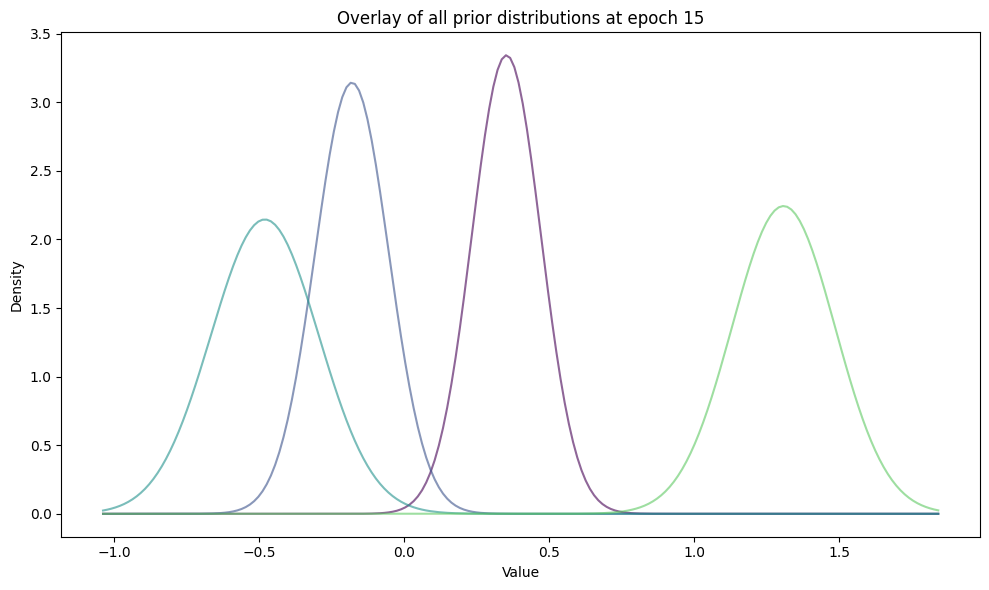

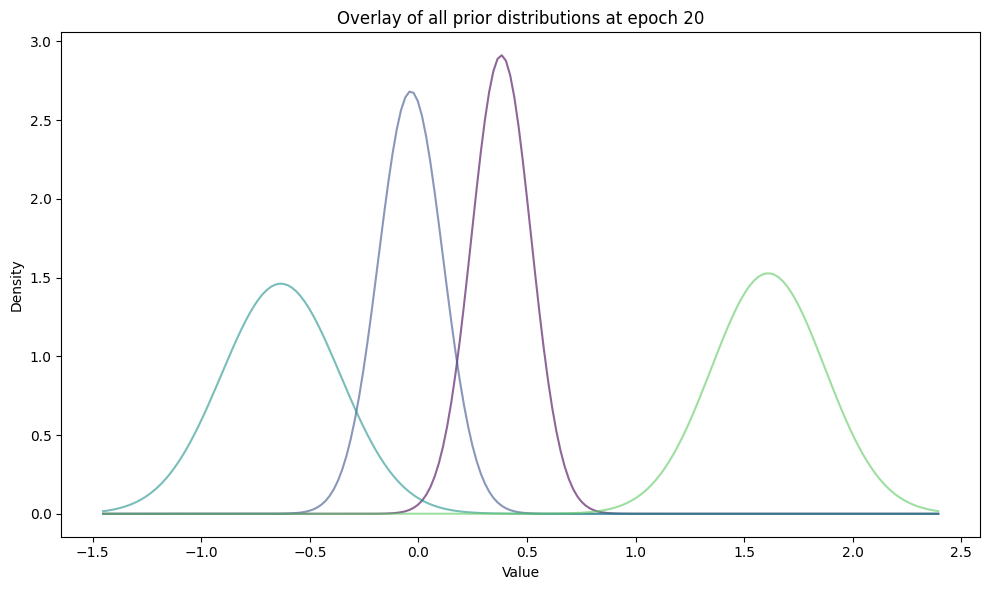

...

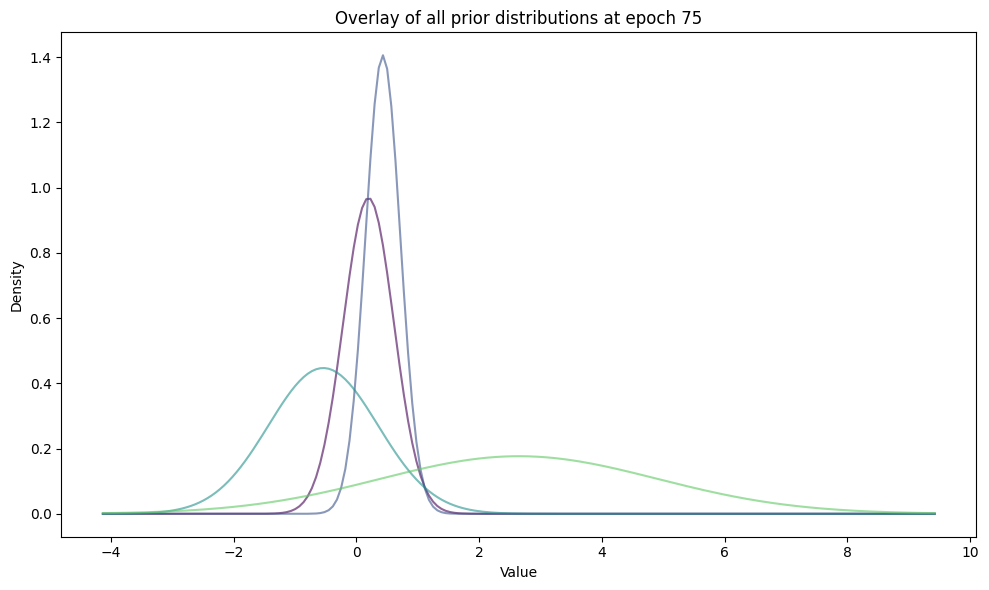

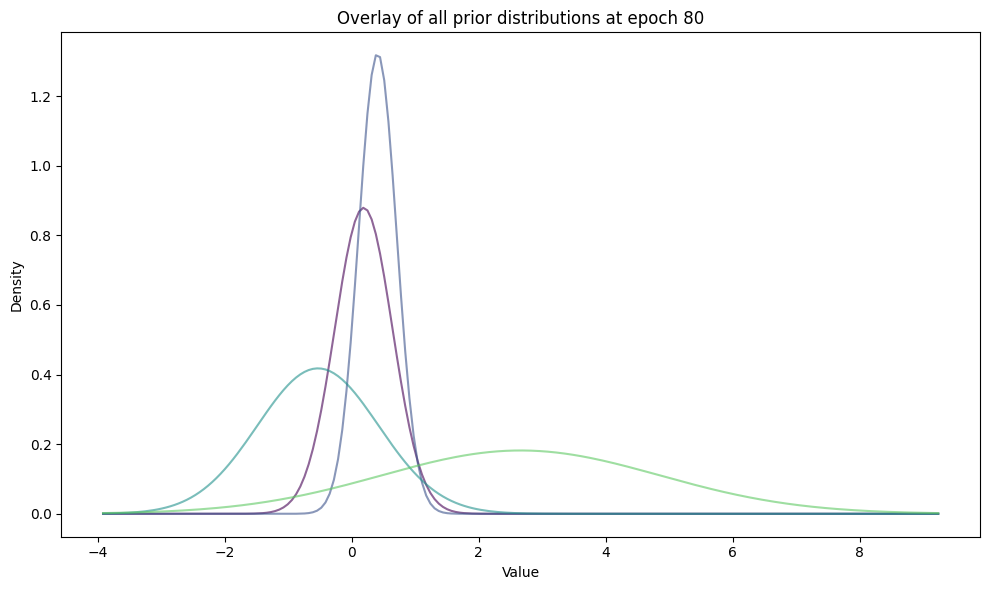

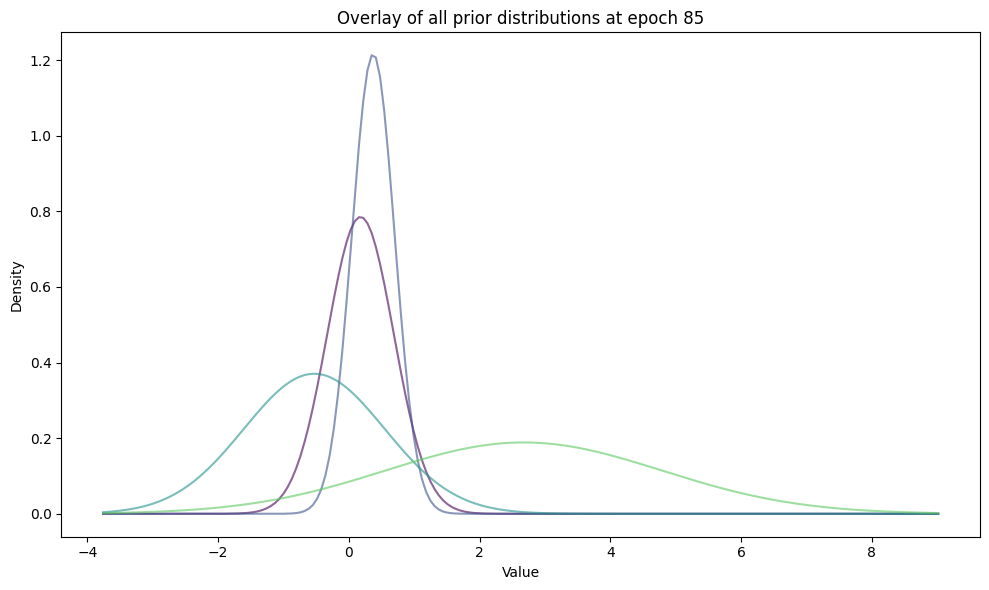

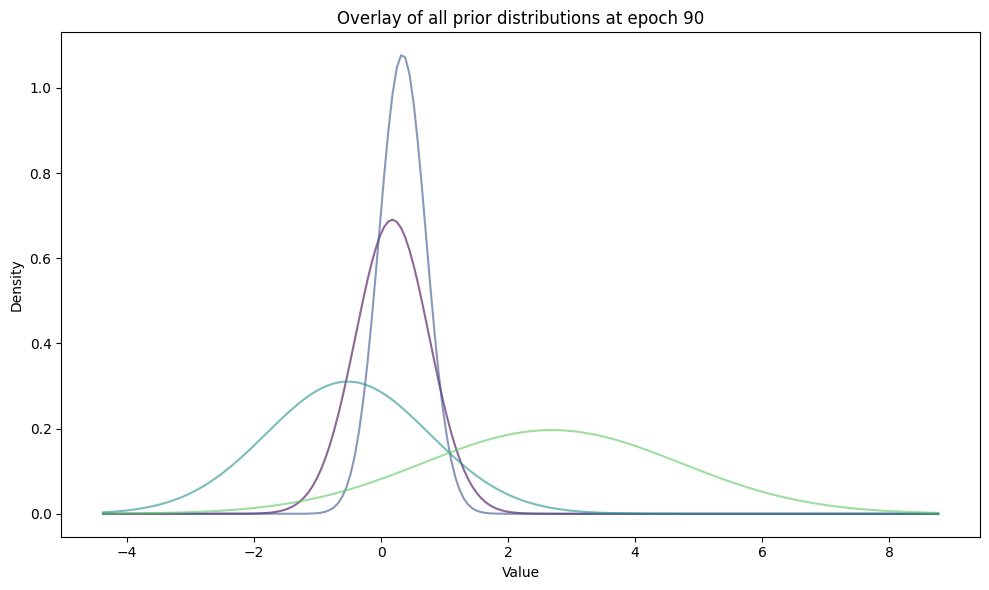

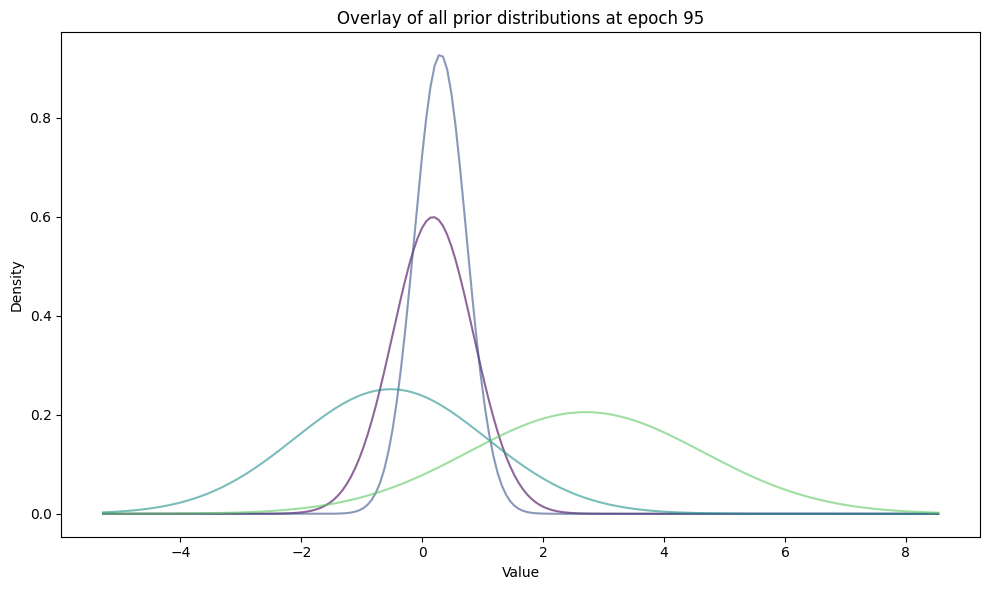

In [19]:
plot_epoch_distributions(distribution_log, dist_type= 'prior')

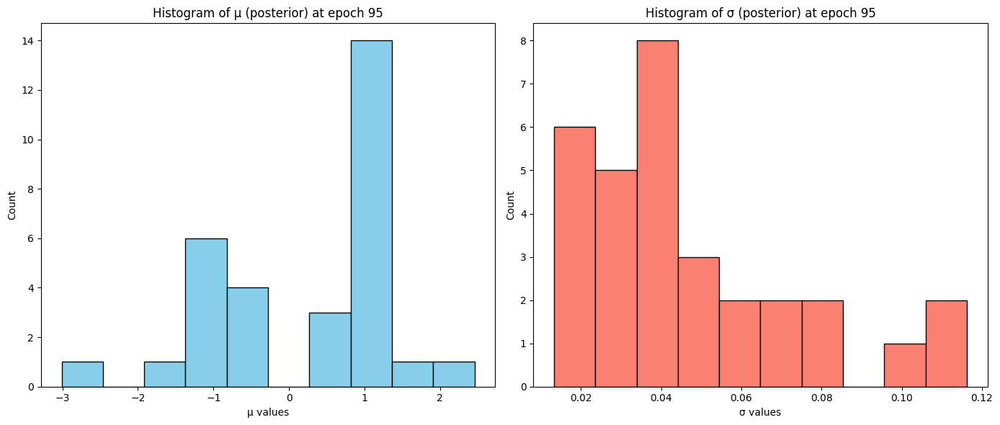

In [47]:
plot_mu_sigma_histograms(distribution_log, bins=10)

In [46]:
stats_table = get_overall_weight_stats(distribution_log)  # Defaults to last epoch, posterior
print(stats_table)

stats_table1 = get_overall_weight_stats(distribution_log_bnn)  # Defaults to last epoch, posterior
print(stats_table1)

     Layer  Mean of Mu's  SD of Mu's  Mean of Sigma's  SD of Sigma's
0  Overall     -0.134395    1.152848         0.052322       0.030579
1      fc1     -0.875192    0.185513         0.044345       0.026304
2      fc2      0.606401    1.235372         0.060299       0.032418
     Layer  Mean of Mu's  SD of Mu's  Mean of Sigma's  SD of Sigma's
0  Overall      0.428542    2.643259         0.060918       0.046043
1        0      0.378438    1.844162         0.059735       0.059209
2        2      0.478647    3.250798         0.062101       0.027046


In [40]:

#Defining a Standard BNN model
bnn_model = nn.Sequential(
    bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=1, out_features=10),
    nn.ReLU(),
    bnn.BayesLinear(prior_mu=0, prior_sigma=0.1, in_features=10, out_features=1),
)

mse_loss = nn.MSELoss()
kl_loss = bnn.BKLLoss(reduction='mean', last_layer_only=False)
kl_weight = 0.01


model = bnn_model
optimizer = optim.Adam(model.parameters(), lr=0.1)

distribution_log_bnn = {}


for epoch in range(100):
    optimizer.zero_grad()
    output = model(x)
    mse = mse_loss(output, y)
    kl = kl_loss(model)
    loss = mse + kl_weight * kl
    loss.backward()
    optimizer.step()

    # Only log on the specified step.
    log_data = get_all_distribution_params(model, epoch, step_size=5)
    if log_data:  # Only add non-empty logs.
        distribution_log_bnn[epoch] = log_data

    if epoch % 10 == 0:
        print(f"Epoch {epoch}: MSE = {mse.item():.4f}, KL = {kl.item():.4f}")

Epoch 0: MSE = 46.2752, KL = 13.5485
Epoch 10: MSE = 27.7757, KL = 32.8960
Epoch 20: MSE = 25.9405, KL = 47.3881
Epoch 30: MSE = 21.9426, KL = 63.4474
Epoch 40: MSE = 18.0435, KL = 93.8362
Epoch 50: MSE = 16.2448, KL = 131.6282
Epoch 60: MSE = 11.5907, KL = 174.0422
Epoch 70: MSE = 10.4224, KL = 230.0031
Epoch 80: MSE = 5.3559, KL = 273.9415
Epoch 90: MSE = 4.1362, KL = 308.1874


In [49]:
kl_table = compute_layer_kl_divergences(distribution_log, epoch=95, dist_type='posterior')
print(kl_table)
kl_table1 = compute_layer_kl_divergences(distribution_log_bnn, epoch=95, dist_type='posterior')
print(kl_table1)

  Layer  Weight KL Sum  Weight KL Average   Bias KL Sum  Bias KL Average
0   fc1    7037.166040         156.381468  24863.680811        552.52624
1   fc2  393859.215754        8752.427017      0.000000          0.00000
  Layer  Weight KL Sum  Weight KL Average   Bias KL Sum  Bias KL Average
0     0  971662.538585       21592.500857  2.761674e+06     61370.532099
1     2  651445.022494       14476.556055  0.000000e+00         0.000000


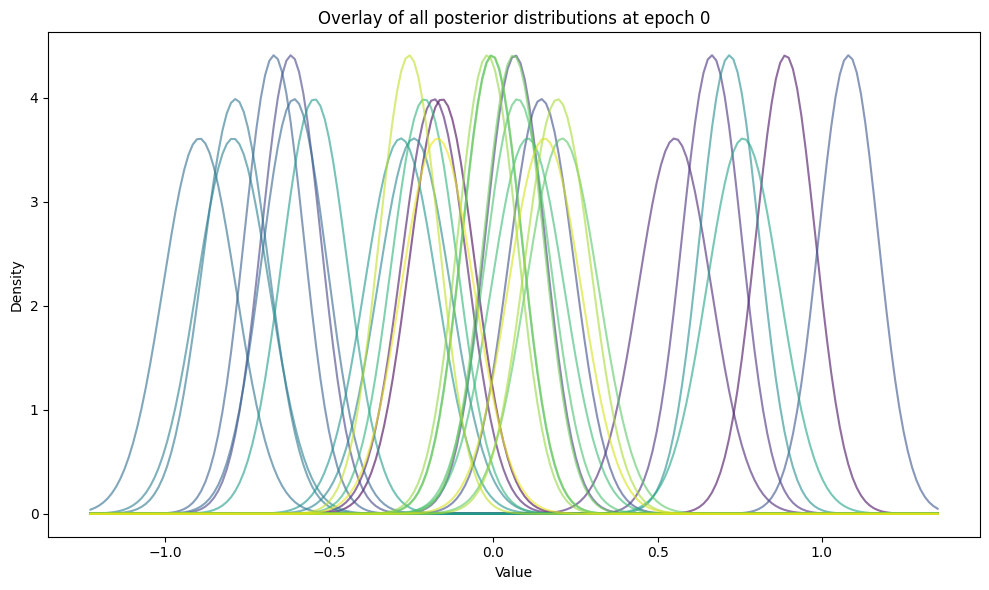

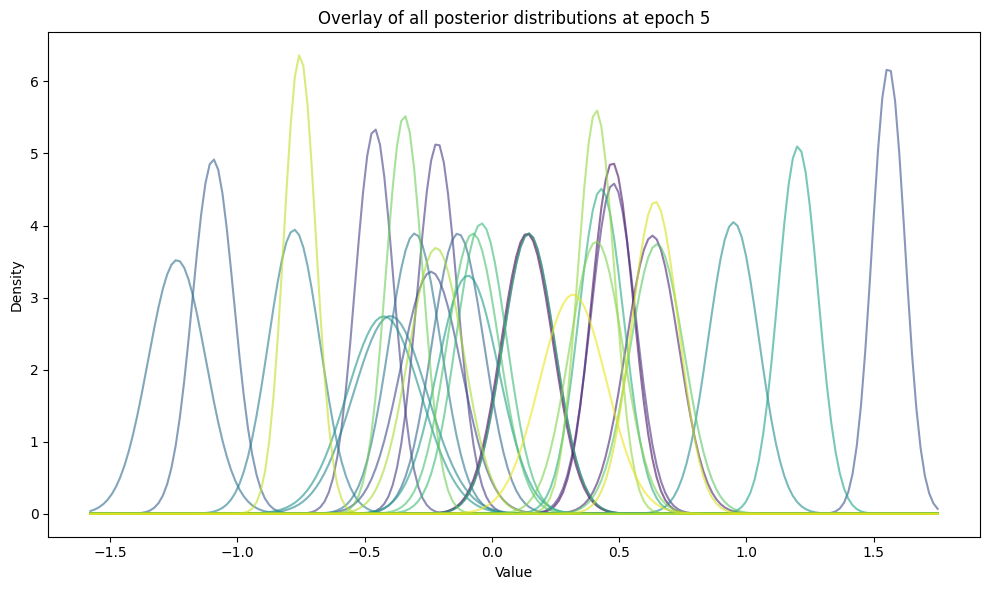

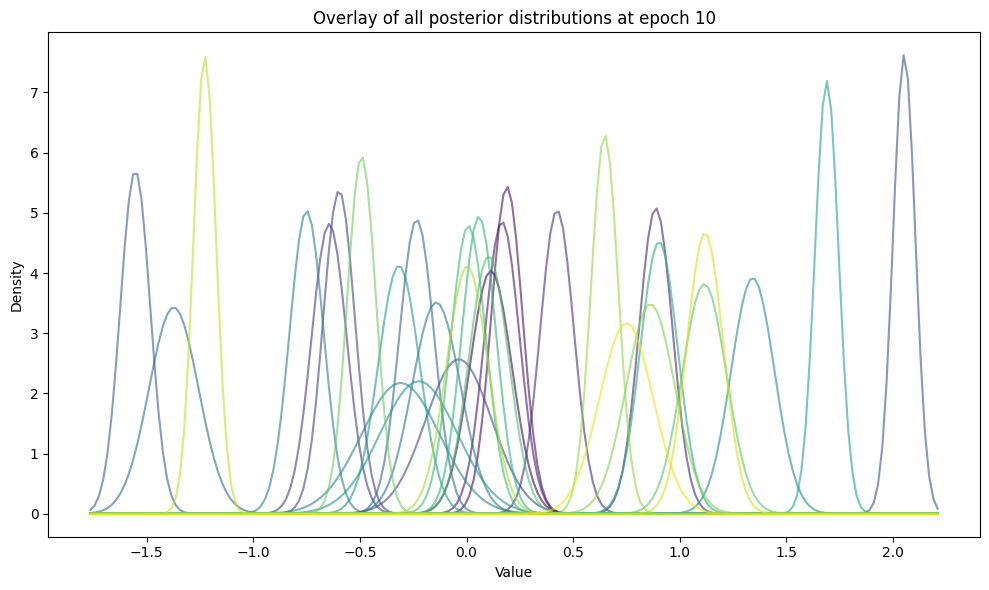

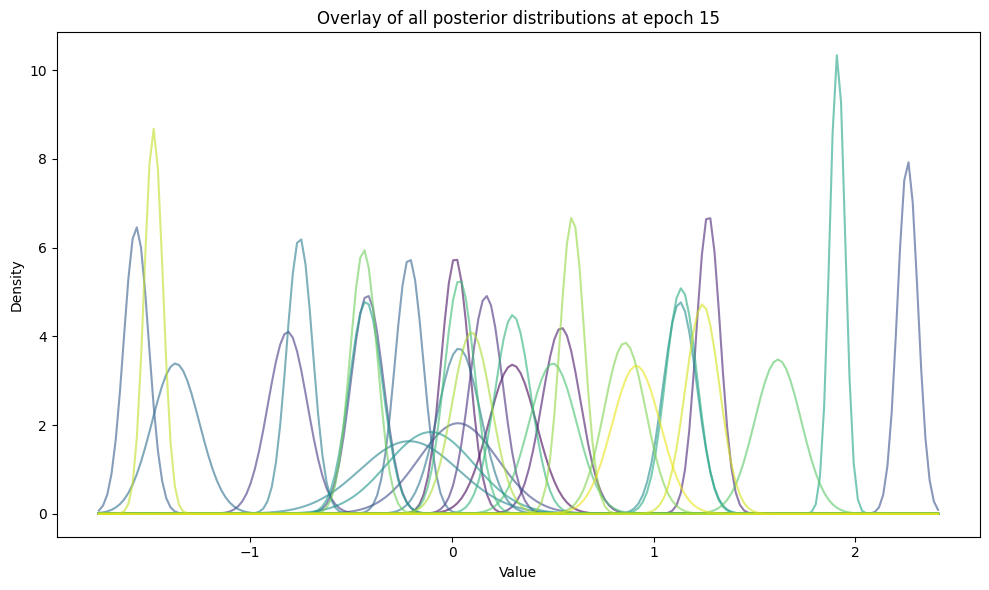

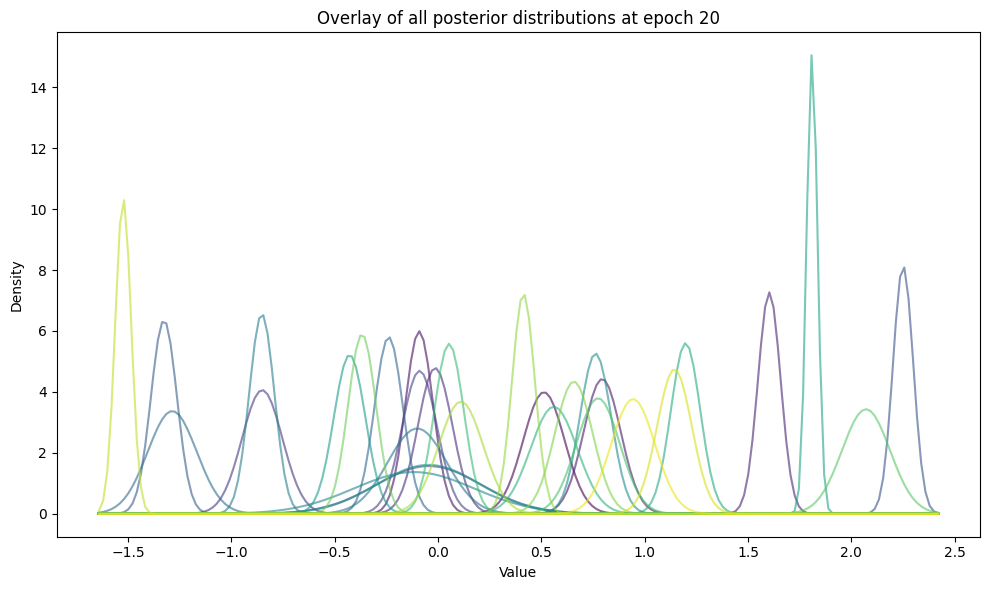

...

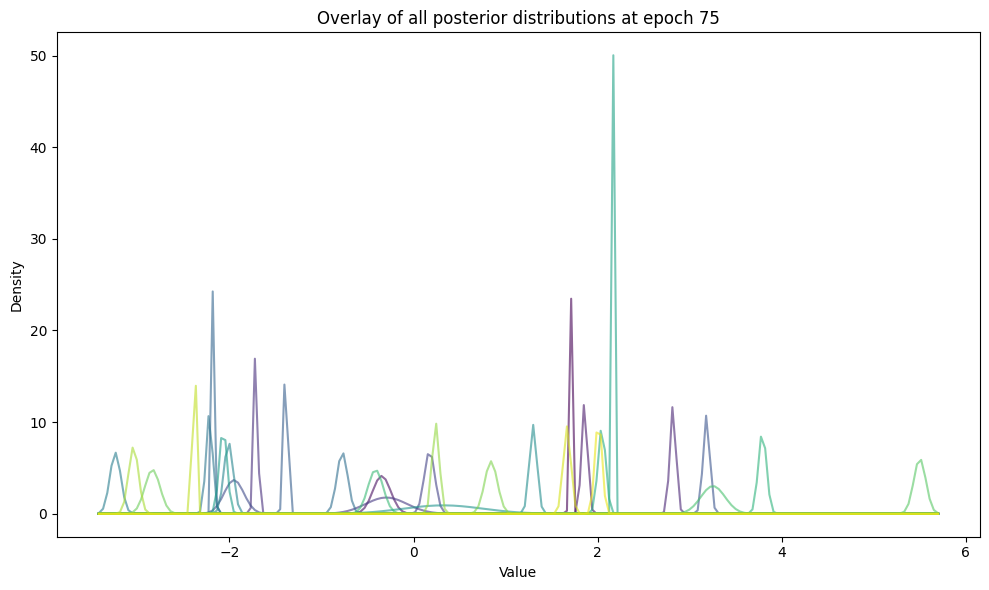

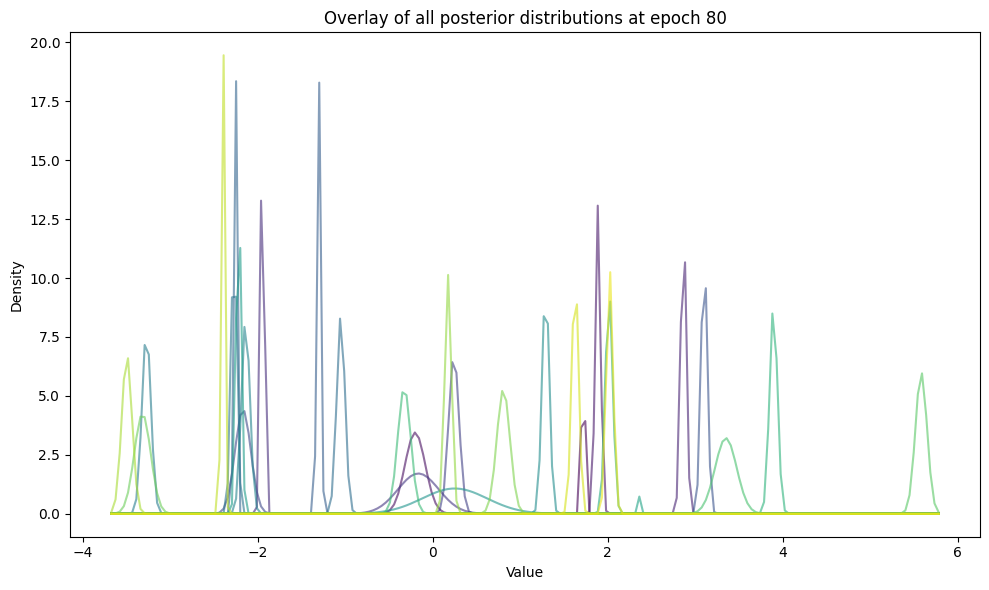

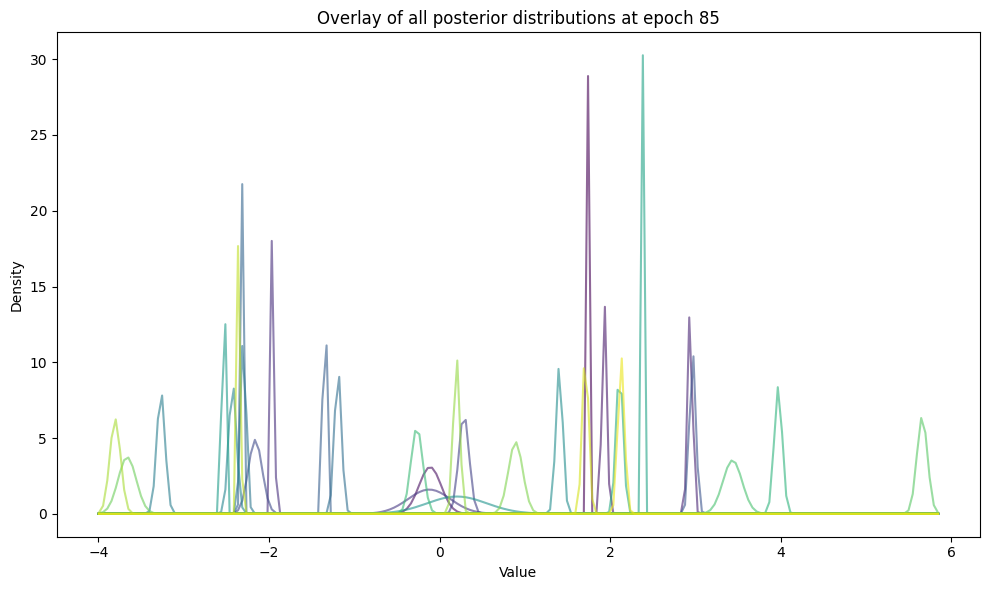

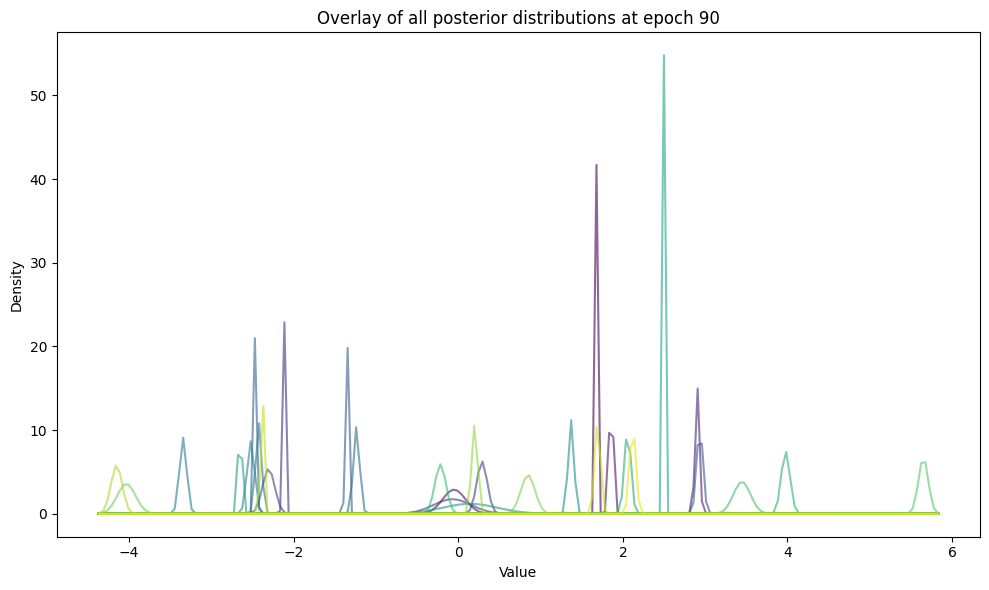

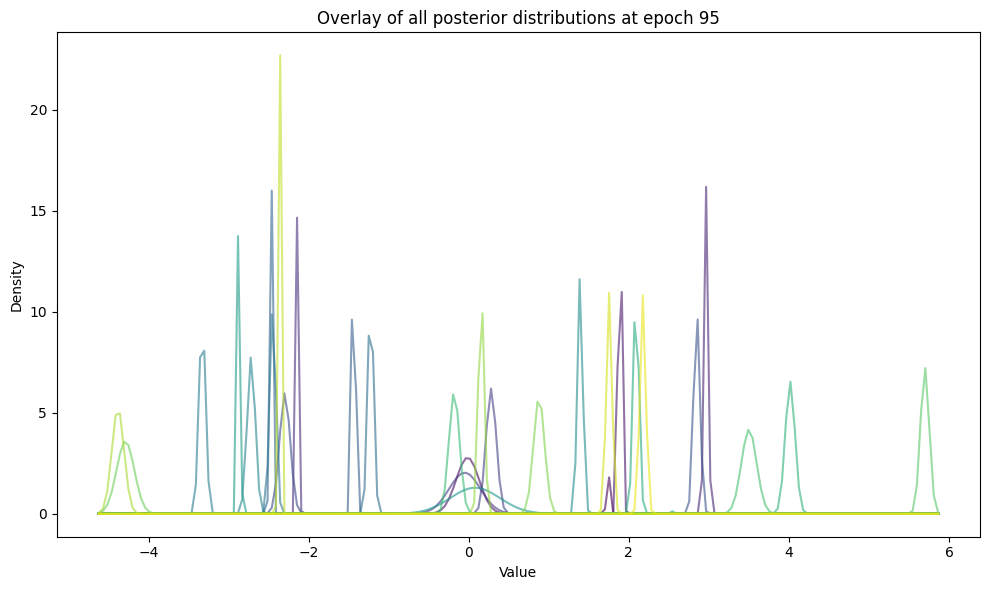

In [41]:
plot_epoch_distributions(distribution_log_bnn, dist_type= 'posterior')